# Model Evaluation Metrics

This notebook evaluates the original Qwen3-VL model and the LoRA fine-tuned model using the aligned dataframes.

The metrics are adapted to four evaluation tasks:

1. Multilabel Object Recognition
2. Environmental Scene Understanding
3. Hazard and Anomaly Detection
4. Scene Captioning


## Quantitative & Qualitative Analysis

- **Primary Metrics to determine Accuracy, Precision, Recall, F1,BLEU, METEOR**
- **Secondary Metrics to determine Hallucination Rate and False Alarm Rate**
- **XAI Techniques**

**Imports and configuration**

In [1]:
from pathlib import Path
import json
import re
from collections import Counter

import numpy as np
import pandas as pd

from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    f1_score,
    precision_score,
    recall_score,
)

PROJECT_DIR = Path(r"C:\Users\becker\Documents\Thesis")
DATAFRAME_DIR = PROJECT_DIR / "dataset"

BASE_DATAFRAME_PATH = DATAFRAME_DIR / "base_dataframe.jsonl"
FINETUNED_DATAFRAME_PATH = DATAFRAME_DIR / "finetuned_dataframe.jsonl"

METRICS_OUTPUT_DIR = PROJECT_DIR / "metric_results"
METRICS_OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

EXPECTED_TASK_COUNTS = {
    "Multilabel Object Recognition": 1500,
    "Environmental Scene Understanding": 1500,
    "Hazard and Anomaly Detection": 1500,
    "Traffic Scene Captioning": 1500,
}

print("Base dataframe:", BASE_DATAFRAME_PATH)
print("Fine-tuned dataframe:", FINETUNED_DATAFRAME_PATH)
print("Metrics output directory:", METRICS_OUTPUT_DIR)

Base dataframe: C:\Users\becker\Documents\Thesis\dataset\base_dataframe.jsonl
Fine-tuned dataframe: C:\Users\becker\Documents\Thesis\dataset\finetuned_dataframe.jsonl
Metrics output directory: C:\Users\becker\Documents\Thesis\metric_results


**Load the two evaluation dataframes**

In [2]:
def load_jsonl_dataframe(path):
    path = Path(path)

    if not path.exists():
        raise FileNotFoundError(
            f"Dataframe file not found: {path}"
        )

    return pd.read_json(
        path,
        orient="records",
        lines=True,
    )


df_base = load_jsonl_dataframe(
    BASE_DATAFRAME_PATH
)

df_finetuned = load_jsonl_dataframe(
    FINETUNED_DATAFRAME_PATH
)

print("Base dataframe shape:", df_base.shape)
print("Fine-tuned dataframe shape:", df_finetuned.shape)

Base dataframe shape: (6000, 73)
Fine-tuned dataframe shape: (6000, 73)


**Validate completeness and row alignment**

In [3]:
REQUIRED_COLUMNS = {
    "evaluation_id",
    "master_row_index",
    "task",
    "instruction",
    "ground_truth_text",
    "predicted_output",
    "eval_status",
    "model_variant",
}


def validate_dataframe(dataframe, name):
    missing_columns = REQUIRED_COLUMNS - set(
        dataframe.columns
    )

    if missing_columns:
        raise ValueError(
            f"{name} is missing required columns: "
            f"{sorted(missing_columns)}"
        )

    if len(dataframe) != 6000:
        raise ValueError(
            f"{name} must contain 6000 rows; "
            f"found {len(dataframe)}."
        )

    if dataframe["evaluation_id"].duplicated().any():
        raise ValueError(
            f"{name} contains duplicate evaluation_id values."
        )

    task_counts = dataframe["task"].value_counts().to_dict()

    if task_counts != EXPECTED_TASK_COUNTS:
        raise ValueError(
            f"{name} has an unexpected task distribution: "
            f"{task_counts}"
        )

    incomplete_count = int(
        dataframe["eval_status"].ne("Completed").sum()
    )

    missing_prediction_count = int(
        dataframe["predicted_output"].isna().sum()
    )

    empty_prediction_count = int(
        dataframe["predicted_output"]
        .fillna("")
        .astype(str)
        .str.strip()
        .eq("")
        .sum()
    )

    return {
        "rows": int(len(dataframe)),
        "unique_evaluation_ids": int(
            dataframe["evaluation_id"].nunique()
        ),
        "task_counts": task_counts,
        "incomplete_rows": incomplete_count,
        "missing_predictions": missing_prediction_count,
        "empty_predictions": empty_prediction_count,
    }


base_validation = validate_dataframe(
    df_base,
    "Base dataframe",
)

finetuned_validation = validate_dataframe(
    df_finetuned,
    "Fine-tuned dataframe",
)

base_ids = df_base["evaluation_id"].tolist()
finetuned_ids = df_finetuned["evaluation_id"].tolist()

if base_ids != finetuned_ids:
    raise ValueError(
        "The base and fine-tuned dataframes are not aligned "
        "in the same evaluation_id order."
    )

base_ground_truth = df_base[
    ["evaluation_id", "ground_truth_text"]
].copy()

finetuned_ground_truth = df_finetuned[
    ["evaluation_id", "ground_truth_text"]
].copy()

if not base_ground_truth.equals(finetuned_ground_truth):
    raise ValueError(
        "Ground-truth values differ between the two dataframes."
    )

print("Base validation:")
print(json.dumps(base_validation, indent=2))

print("\nFine-tuned validation:")
print(json.dumps(finetuned_validation, indent=2))

print("\nAlignment checks passed:")
print("- Same 6,000 evaluation IDs")
print("- Same row order")
print("- Same ground truths")

Base validation:
{
  "rows": 6000,
  "unique_evaluation_ids": 6000,
  "task_counts": {
    "Hazard and Anomaly Detection": 1500,
    "Traffic Scene Captioning": 1500,
    "Multilabel Object Recognition": 1500,
    "Environmental Scene Understanding": 1500
  },
  "incomplete_rows": 0,
  "missing_predictions": 0,
  "empty_predictions": 0
}

Fine-tuned validation:
{
  "rows": 6000,
  "unique_evaluation_ids": 6000,
  "task_counts": {
    "Hazard and Anomaly Detection": 1500,
    "Traffic Scene Captioning": 1500,
    "Multilabel Object Recognition": 1500,
    "Environmental Scene Understanding": 1500
  },
  "incomplete_rows": 0,
  "missing_predictions": 0,
  "empty_predictions": 0
}

Alignment checks passed:
- Same 6,000 evaluation IDs
- Same row order
- Same ground truths


**Create task-specific dataframe views**

In [4]:
TASK_NAMES = list(EXPECTED_TASK_COUNTS)

base_by_task = {
    task: (
        df_base[df_base["task"] == task]
        .copy()
        .reset_index(drop=True)
    )
    for task in TASK_NAMES
}

finetuned_by_task = {
    task: (
        df_finetuned[df_finetuned["task"] == task]
        .copy()
        .reset_index(drop=True)
    )
    for task in TASK_NAMES
}

for task in TASK_NAMES:
    base_task_ids = base_by_task[task][
        "evaluation_id"
    ].tolist()

    finetuned_task_ids = finetuned_by_task[task][
        "evaluation_id"
    ].tolist()

    if base_task_ids != finetuned_task_ids:
        raise ValueError(
            f"Task alignment failed for {task}."
        )

    print(
        f"{task}: "
        f"{len(base_by_task[task])} aligned rows"
    )

Multilabel Object Recognition: 1500 aligned rows
Environmental Scene Understanding: 1500 aligned rows
Hazard and Anomaly Detection: 1500 aligned rows
Traffic Scene Captioning: 1500 aligned rows


**Multi-Label Object Recognition**

- Metrics:  Precision, Recall, F1 score, Hallucination rate

In [6]:
MOR_TASK = "Multilabel Object Recognition"

base_mor = base_by_task[MOR_TASK].copy()
finetuned_mor = finetuned_by_task[MOR_TASK].copy()

print("Base MOR rows:", len(base_mor))
print("Fine-tuned MOR rows:", len(finetuned_mor))
print(
    "Aligned:",
    base_mor["evaluation_id"].tolist()
    == finetuned_mor["evaluation_id"].tolist()
)

Base MOR rows: 1500
Fine-tuned MOR rows: 1500
Aligned: True


In [7]:
import ast
import re
import numpy as np
import pandas as pd

from sklearn.metrics import (
    precision_score,
    recall_score,
    f1_score,
)

# Canonical labels defined by the MOR task.
MOR_LABELS = [
    "car",
    "truck",
    "bus",
    "person",
    "rider",
    "bicycle",
    "motorcycle",
    "train",
    "traffic light",
    "traffic sign",
]

# Normalizes common alternative model outputs.
MOR_LABEL_ALIASES = {
    "cars": "car",
    "trucks": "truck",
    "buses": "bus",
    "people": "person",
    "persons": "person",
    "pedestrian": "person",
    "pedestrians": "person",
    "riders": "rider",
    "bike": "bicycle",
    "bikes": "bicycle",
    "bicycles": "bicycle",
    "motor": "motorcycle",
    "motorbike": "motorcycle",
    "motorbikes": "motorcycle",
    "motorcycles": "motorcycle",
    "trains": "train",
    "traffic lights": "traffic light",
    "traffic signals": "traffic light",
    "traffic signs": "traffic sign",
    "road sign": "traffic sign",
    "road signs": "traffic sign",
}


def normalize_label(label):
    """Normalize one candidate label."""
    label = str(label).lower().strip()

    # Remove surrounding punctuation and normalize whitespace.
    label = re.sub(r"[^a-z\s-]", "", label)
    label = re.sub(r"\s+", " ", label).strip()

    return MOR_LABEL_ALIASES.get(label, label)


def parse_ground_truth(value):
    """Convert ground_truth_classes into a canonical label set."""
    if isinstance(value, (list, tuple, set, np.ndarray)):
        labels = value
    elif pd.isna(value):
        labels = []
    else:
        text = str(value).strip()

        try:
            parsed = ast.literal_eval(text)
            labels = parsed if isinstance(parsed, (list, tuple, set)) else [text]
        except (ValueError, SyntaxError):
            labels = re.split(r"[,;|\n]", text)

    return {
        normalize_label(label)
        for label in labels
        if normalize_label(label) in MOR_LABELS
    }


def parse_prediction(value):
    """Extract canonical MOR labels from a model prediction."""
    if pd.isna(value):
        return set()

    text = str(value).lower()

    # Replace common aliases before canonical-label extraction.
    for alias in sorted(MOR_LABEL_ALIASES, key=len, reverse=True):
        canonical = MOR_LABEL_ALIASES[alias]
        text = re.sub(
            rf"\b{re.escape(alias)}\b",
            canonical,
            text,
        )

    predicted_labels = set()

    # Extract complete canonical label names using word boundaries.
    for label in sorted(MOR_LABELS, key=len, reverse=True):
        if re.search(rf"\b{re.escape(label)}\b", text):
            predicted_labels.add(label)

    return predicted_labels


def encode_label_sets(label_sets):
    """Convert sets of labels into a binary multilabel matrix."""
    return np.array(
        [
            [int(label in labels) for label in MOR_LABELS]
            for labels in label_sets
        ],
        dtype=int,
    )


def calculate_mor_primary_metrics(dataframe, model_name):
    """Calculate overall and per-class Precision, Recall and F1."""
    ground_truth_sets = dataframe["ground_truth_classes"].apply(
        parse_ground_truth
    )

    prediction_sets = dataframe["predicted_output"].apply(
        parse_prediction
    )

    y_true = encode_label_sets(ground_truth_sets)
    y_pred = encode_label_sets(prediction_sets)

    overall_rows = []

    for averaging_method in ["micro", "macro", "samples"]:
        overall_rows.append(
            {
                "Model": model_name,
                "Averaging": averaging_method.capitalize(),
                "Precision": precision_score(
                    y_true,
                    y_pred,
                    average=averaging_method,
                    zero_division=0,
                ),
                "Recall": recall_score(
                    y_true,
                    y_pred,
                    average=averaging_method,
                    zero_division=0,
                ),
                "F1": f1_score(
                    y_true,
                    y_pred,
                    average=averaging_method,
                    zero_division=0,
                ),
            }
        )

    per_class_precision = precision_score(
        y_true,
        y_pred,
        average=None,
        zero_division=0,
    )

    per_class_recall = recall_score(
        y_true,
        y_pred,
        average=None,
        zero_division=0,
    )

    per_class_f1 = f1_score(
        y_true,
        y_pred,
        average=None,
        zero_division=0,
    )

    per_class_rows = []

    for index, label in enumerate(MOR_LABELS):
        per_class_rows.append(
            {
                "Model": model_name,
                "Class": label,
                "Precision": per_class_precision[index],
                "Recall": per_class_recall[index],
                "F1": per_class_f1[index],
                "Ground_truth_support": int(y_true[:, index].sum()),
                "Predicted_support": int(y_pred[:, index].sum()),
            }
        )

    return (
        pd.DataFrame(overall_rows),
        pd.DataFrame(per_class_rows),
    )


# Calculate metrics for both models.
base_mor_primary, base_mor_per_class = calculate_mor_primary_metrics(
    base_mor,
    "Base",
)

finetuned_mor_primary, finetuned_mor_per_class = (
    calculate_mor_primary_metrics(
        finetuned_mor,
        "Fine-tuned",
    )
)

# Combine model results.
mor_primary_metrics = pd.concat(
    [
        base_mor_primary,
        finetuned_mor_primary,
    ],
    ignore_index=True,
)

mor_per_class_metrics = pd.concat(
    [
        base_mor_per_class,
        finetuned_mor_per_class,
    ],
    ignore_index=True,
)

print("Overall Multilabel Object Recognition metrics:")
display(
    mor_primary_metrics.round(4)
)

print("Per-class Multilabel Object Recognition metrics:")
display(
    mor_per_class_metrics.round(4)
)

Overall Multilabel Object Recognition metrics:


,Model,Averaging,Precision,Recall,F1
0,Base,Micro,0.7900,0.8323,0.8106
1,Base,Macro,0.6324,0.6624,0.6344
2,Base,Samples,0.8310,0.8556,0.8063
3,Fine-tuned,Micro,0.5062,0.8094,0.6229
4,Fine-tuned,Macro,0.4413,0.7621,0.5043
5,Fine-tuned,Samples,0.6704,0.8100,0.6210


Per-class Multilabel Object Recognition metrics:


,Model,Class,Precision,Recall,F1,Ground_truth_support,Predicted_support
0,Base,car,0.9959,0.9885,0.9922,1483,1472
1,Base,truck,0.5199,0.7875,0.6263,447,677
2,Base,bus,0.5128,0.6178,0.5604,259,312
3,Base,person,0.7768,0.7578,0.7672,574,560
4,Base,rider,0.6805,0.4373,0.5324,263,169
5,Base,bicycle,0.6684,0.5061,0.5760,247,187
6,Base,motorcycle,0.4265,0.5438,0.4780,160,204
7,Base,train,0.0492,0.2143,0.0800,14,61
8,Base,traffic light,0.8268,0.8471,0.8368,896,918
9,Base,traffic sign,0.8668,0.9241,0.8945,1225,1306


**Hallucination Rate Analysis**

,Model,Total predicted object classes,Hallucinated object classes,Object-class hallucination rate (%)
0,Base,5866,1232,21.002
1,Fine-tuned,8904,4397,49.382


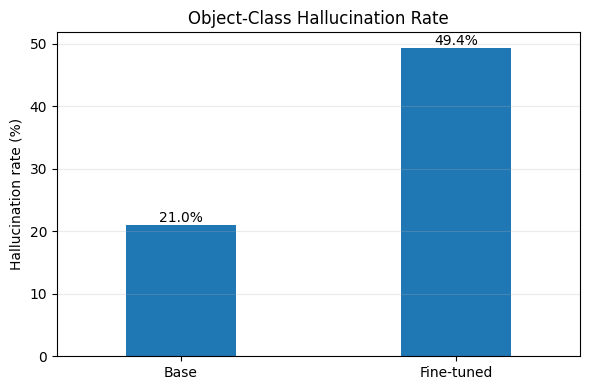

In [18]:
import pandas as pd
import matplotlib.pyplot as plt


def calculate_object_class_hallucination_rate(dataframe, model_name):
    """
    Object-class hallucination rate:

    Number of predicted object classes absent from the ground truth
    divided by the total number of predicted object classes.
    """
    total_predicted_classes = 0
    total_hallucinated_classes = 0

    for _, row in dataframe.iterrows():
        ground_truth_classes = parse_ground_truth(
            row["ground_truth_classes"]
        )

        predicted_classes = parse_prediction(
            row["predicted_output"]
        )

        hallucinated_classes = (
            predicted_classes - ground_truth_classes
        )

        total_predicted_classes += len(
            predicted_classes
        )

        total_hallucinated_classes += len(
            hallucinated_classes
        )

    hallucination_rate = (
        total_hallucinated_classes
        / total_predicted_classes
        if total_predicted_classes > 0
        else 0
    )

    return {
        "Model": model_name,
        "Total predicted object classes": total_predicted_classes,
        "Hallucinated object classes": total_hallucinated_classes,
        "Object-class hallucination rate": hallucination_rate,
    }


base_hallucination = calculate_object_class_hallucination_rate(
    base_mor,
    "Base",
)

finetuned_hallucination = calculate_object_class_hallucination_rate(
    finetuned_mor,
    "Fine-tuned",
)

mor_hallucination_results = pd.DataFrame(
    [
        base_hallucination,
        finetuned_hallucination,
    ]
)

mor_hallucination_results[
    "Object-class hallucination rate (%)"
] = (
    mor_hallucination_results[
        "Object-class hallucination rate"
    ]
    * 100
)

display(
    mor_hallucination_results[
        [
            "Model",
            "Total predicted object classes",
            "Hallucinated object classes",
            "Object-class hallucination rate (%)",
        ]
    ].round(3)
)


# Clean comparison plot.
ax = mor_hallucination_results.plot(
    x="Model",
    y="Object-class hallucination rate (%)",
    kind="bar",
    legend=False,
    figsize=(6, 4),
    width=0.4,
)

ax.set_title(
    "Object-Class Hallucination Rate"
)

ax.set_xlabel("")
ax.set_ylabel("Hallucination rate (%)")

ax.tick_params(
    axis="x",
    rotation=0,
)

ax.grid(
    axis="y",
    alpha=0.25,
)

for container in ax.containers:
    ax.bar_label(
        container,
        fmt="%.1f%%",
        padding=0,
    )

plt.tight_layout()
plt.show()

**Scene Captioning**
- Metrics: BLEU, METEOR

In [19]:
CAPTIONING_TASK = "Traffic Scene Captioning"

base_captioning = base_by_task[CAPTIONING_TASK].copy()
finetuned_captioning = finetuned_by_task[CAPTIONING_TASK].copy()

print("Base captioning rows:", len(base_captioning))
print("Fine-tuned captioning rows:", len(finetuned_captioning))

print(
    "Aligned:",
    base_captioning["evaluation_id"].tolist()
    == finetuned_captioning["evaluation_id"].tolist()
)

display(
    base_captioning[
        [
            "evaluation_id",
            "reference_caption",
            "predicted_output",
        ]
    ].head()
)

Base captioning rows: 1500
Fine-tuned captioning rows: 1500
Aligned: True


,evaluation_id,reference_caption,predicted_output
0,traffic_scene_captioning::sc_rep_0958,A clear nighttime city street scene featuring ...,"The scene is a dark, nighttime road with low v..."
1,traffic_scene_captioning::sc_rep_0679,A clear daytime city street scene featuring a ...,"The scene depicts a clear, sunny day with brig..."
2,traffic_scene_captioning::sc_chal_0238,A rainy highway scene at dawn or dusk featurin...,The scene is a multi-lane highway during twili...
3,traffic_scene_captioning::sc_rep_0094,A rainy nighttime city street scene featuring ...,"At night, a wet urban street is filled with tr..."
4,traffic_scene_captioning::sc_chal_0072,A clear daytime city street scene featuring a ...,The scene depicts a sunny daytime urban street...


In [20]:
import re
import nltk
import pandas as pd

from nltk.translate.bleu_score import (
    corpus_bleu,
    sentence_bleu,
    SmoothingFunction,
)
from nltk.translate.meteor_score import meteor_score


# METEOR requires WordNet.
try:
    nltk.data.find("corpora/wordnet")
except LookupError:
    nltk.download("wordnet")
    nltk.download("omw-1.4")


def tokenize_caption(text):
    """Lowercase and tokenize a caption without requiring Punkt."""
    if pd.isna(text):
        return []

    return re.findall(
        r"[a-z0-9]+(?:'[a-z0-9]+)?",
        str(text).lower(),
    )


def calculate_captioning_metrics(dataframe, model_name):
    references = []
    hypotheses = []
    detail_rows = []

    smoothing = SmoothingFunction().method1

    for _, row in dataframe.iterrows():
        reference_tokens = tokenize_caption(
            row["reference_caption"]
        )

        prediction_tokens = tokenize_caption(
            row["predicted_output"]
        )

        # corpus_bleu expects a list of references per prediction.
        references.append([reference_tokens])
        hypotheses.append(prediction_tokens)

        sentence_bleu_4 = sentence_bleu(
            [reference_tokens],
            prediction_tokens,
            weights=(0.25, 0.25, 0.25, 0.25),
            smoothing_function=smoothing,
        )

        meteor = (
            meteor_score(
                [reference_tokens],
                prediction_tokens,
            )
            if reference_tokens and prediction_tokens
            else 0.0
        )

        detail_rows.append(
            {
                "evaluation_id": row["evaluation_id"],
                "Model": model_name,
                "BLEU-4": sentence_bleu_4,
                "METEOR": meteor,
            }
        )

    corpus_bleu_4 = corpus_bleu(
        references,
        hypotheses,
        weights=(0.25, 0.25, 0.25, 0.25),
        smoothing_function=smoothing,
    )

    details = pd.DataFrame(detail_rows)

    summary = {
        "Model": model_name,
        "Corpus BLEU-4": corpus_bleu_4,
        "Mean sentence BLEU-4": details["BLEU-4"].mean(),
        "Mean METEOR": details["METEOR"].mean(),
    }

    return summary, details


base_captioning_summary, base_captioning_metric_details = (
    calculate_captioning_metrics(
        base_captioning,
        "Base",
    )
)

finetuned_captioning_summary, finetuned_captioning_metric_details = (
    calculate_captioning_metrics(
        finetuned_captioning,
        "Fine-tuned",
    )
)

captioning_metrics = pd.DataFrame(
    [
        base_captioning_summary,
        finetuned_captioning_summary,
    ]
)

captioning_metric_details = pd.concat(
    [
        base_captioning_metric_details,
        finetuned_captioning_metric_details,
    ],
    ignore_index=True,
)

print("Traffic Scene Captioning metrics:")
display(captioning_metrics.round(4))

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\becker\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\becker\AppData\Roaming\nltk_data...


Traffic Scene Captioning metrics:


,Model,Corpus BLEU-4,Mean sentence BLEU-4,Mean METEOR
0,Base,0.0077,0.0092,0.2803
1,Fine-tuned,0.0120,0.0217,0.1946


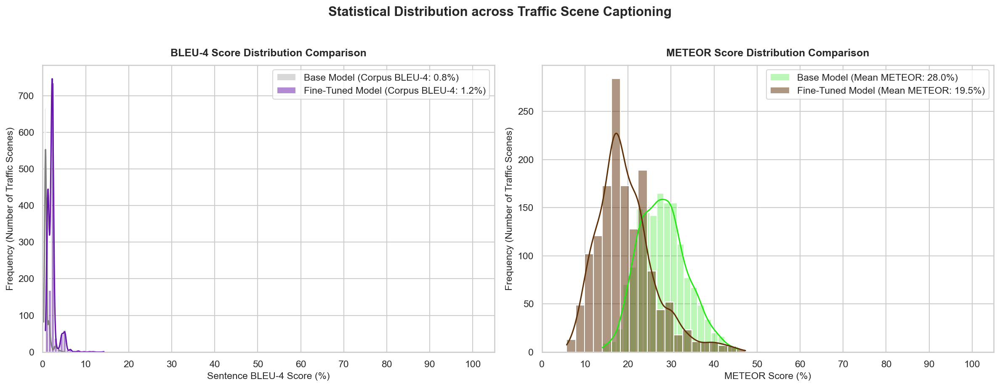

In [22]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


# Extract sentence-level metric distributions.
base_caption_details = captioning_metric_details[
    captioning_metric_details["Model"] == "Base"
]

finetuned_caption_details = captioning_metric_details[
    captioning_metric_details["Model"] == "Fine-tuned"
]

base_bleu_pct = (
    base_caption_details["BLEU-4"].to_numpy() * 100
)

finetuned_bleu_pct = (
    finetuned_caption_details["BLEU-4"].to_numpy() * 100
)

base_meteor_pct = (
    base_caption_details["METEOR"].to_numpy() * 100
)

finetuned_meteor_pct = (
    finetuned_caption_details["METEOR"].to_numpy() * 100
)


# Retrieve the aggregate values calculated previously.
base_corpus_bleu = (
    captioning_metrics.loc[
        captioning_metrics["Model"] == "Base",
        "Corpus BLEU-4",
    ].iloc[0]
    * 100
)

finetuned_corpus_bleu = (
    captioning_metrics.loc[
        captioning_metrics["Model"] == "Fine-tuned",
        "Corpus BLEU-4",
    ].iloc[0]
    * 100
)

base_mean_meteor = (
    captioning_metrics.loc[
        captioning_metrics["Model"] == "Base",
        "Mean METEOR",
    ].iloc[0]
    * 100
)

finetuned_mean_meteor = (
    captioning_metrics.loc[
        captioning_metrics["Model"] == "Fine-tuned",
        "Mean METEOR",
    ].iloc[0]
    * 100
)


# Match the visualization method used in dataframe.ipynb.
sns.set_theme(style="whitegrid")

fig, axes = plt.subplots(
    1,
    2,
    figsize=(16, 6),
    dpi=150,
)


# BLEU-4 distribution.
sns.histplot(
    base_bleu_pct,
    kde=True,
    color="#7f7f7f",
    ax=axes[0],
    label=(
        f"Base Model "
        f"(Corpus BLEU-4: {base_corpus_bleu:.1f}%)"
    ),
    alpha=0.3,
    bins=20,
)

sns.histplot(
    finetuned_bleu_pct,
    kde=True,
    color="#6616a8",
    ax=axes[0],
    label=(
        f"Fine-Tuned Model "
        f"(Corpus BLEU-4: {finetuned_corpus_bleu:.1f}%)"
    ),
    alpha=0.5,
    bins=20,
)

axes[0].set_title(
    "BLEU-4 Score Distribution Comparison",
    fontsize=12,
    fontweight="bold",
    pad=10,
)

axes[0].set_xlabel(
    "Sentence BLEU-4 Score (%)",
    fontsize=11,
)

axes[0].set_ylabel(
    "Frequency (Number of Traffic Scenes)",
    fontsize=11,
)

axes[0].set_xlim(0, 105)
axes[0].set_xticks(range(0, 101, 10))

axes[0].legend(
    loc="upper right",
    frameon=True,
    facecolor="white",
)


# METEOR distribution.
sns.histplot(
    base_meteor_pct,
    kde=True,
    color="#27e616",
    ax=axes[1],
    label=(
        f"Base Model "
        f"(Mean METEOR: {base_mean_meteor:.1f}%)"
    ),
    alpha=0.3,
    bins=20,
)

sns.histplot(
    finetuned_meteor_pct,
    kde=True,
    color="#5F3007",
    ax=axes[1],
    label=(
        f"Fine-Tuned Model "
        f"(Mean METEOR: {finetuned_mean_meteor:.1f}%)"
    ),
    alpha=0.5,
    bins=20,
)

axes[1].set_title(
    "METEOR Score Distribution Comparison",
    fontsize=12,
    fontweight="bold",
    pad=10,
)

axes[1].set_xlabel(
    "METEOR Score (%)",
    fontsize=11,
)

axes[1].set_ylabel(
    "Frequency (Number of Traffic Scenes)",
    fontsize=11,
)

axes[1].set_xlim(0, 105)
axes[1].set_xticks(range(0, 101, 10))

axes[1].legend(
    loc="upper right",
    frameon=True,
    facecolor="white",
)


plt.suptitle(
    "Statistical Distribution across Traffic Scene Captioning",
    fontsize=15,
    fontweight="bold",
    y=1.02,
)

plt.tight_layout()
plt.show()

**Environmental Scene Understanding**
- Metrics: Accuracy, Recall, Precision, F1 Score, Joint Exact-Match Accuracy 

In [23]:
ESU_TASK = "Environmental Scene Understanding"

base_esu = (
    base_by_task[ESU_TASK]
    .copy()
    .reset_index(drop=True)
)

finetuned_esu = (
    finetuned_by_task[ESU_TASK]
    .copy()
    .reset_index(drop=True)
)

if (
    base_esu["evaluation_id"].tolist()
    != finetuned_esu["evaluation_id"].tolist()
):
    raise ValueError(
        "Environmental Scene Understanding alignment failed."
    )

print("Base ESU rows:", len(base_esu))
print("Fine-tuned ESU rows:", len(finetuned_esu))
print("Aligned: True")

display(
    base_esu[
        [
            "evaluation_id",
            "ground_truth_weather",
            "ground_truth_scene",
            "predicted_output",
        ]
    ].head()
)

Base ESU rows: 1500
Fine-tuned ESU rows: 1500
Aligned: True


,evaluation_id,ground_truth_weather,ground_truth_scene,predicted_output
0,environmental_scene_understanding::esu_rep_0622,rainy,city street,weather: rainy; scene: city street
1,environmental_scene_understanding::esu_rep_0119,partly cloudy,city street,weather: partly cloudy; scene: city street
2,environmental_scene_understanding::esu_rep_0639,clear,highway,weather: clear; scene: highway
3,environmental_scene_understanding::esu_chal_0279,clear,residential,weather: clear; scene: residential
4,environmental_scene_understanding::esu_chal_0033,rainy,city street,weather: rainy; scene: city street


In [26]:
import re
import numpy as np
import pandas as pd

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
)


WEATHER_LABELS = [
    "clear",
    "overcast",
    "partly cloudy",
    "rainy",
    "snowy",
    "foggy",
]

SCENE_LABELS = [
    "city street",
    "highway",
    "residential",
    "parking lot",
    "tunnel",
    "gas station",
]


def extract_esu_label(text, field_name, valid_labels):
    if pd.isna(text):
        return None

    normalized_text = (
        str(text)
        .lower()
        .strip()
    )

    label_pattern = "|".join(
        re.escape(label)
        for label in sorted(
            valid_labels,
            key=len,
            reverse=True,
        )
    )

    match = re.search(
        rf"\b{re.escape(field_name)}\s*:\s*"
        rf"({label_pattern})\b",
        normalized_text,
        flags=re.IGNORECASE,
    )

    if match is None:
        return None

    return match.group(1).lower().strip()


def parse_esu_prediction(text):
    predicted_weather = extract_esu_label(
        text,
        "weather",
        WEATHER_LABELS,
    )

    predicted_scene = extract_esu_label(
        text,
        "scene",
        SCENE_LABELS,
    )

    return predicted_weather, predicted_scene


def calculate_esu_metrics(dataframe, model_name):
    details = dataframe[
        [
            "evaluation_id",
            "ground_truth_weather",
            "ground_truth_scene",
            "predicted_output",
        ]
    ].copy()

    parsed_predictions = details[
        "predicted_output"
    ].apply(parse_esu_prediction)

    details["predicted_weather"] = (
        parsed_predictions.apply(lambda value: value[0])
    )

    details["predicted_scene"] = (
        parsed_predictions.apply(lambda value: value[1])
    )

    # Missing or unparseable predictions remain incorrect.
    weather_predictions = (
        details["predicted_weather"]
        .fillna("__invalid__")
    )

    scene_predictions = (
        details["predicted_scene"]
        .fillna("__invalid__")
    )

    weather_ground_truth = (
        details["ground_truth_weather"]
        .str.lower()
        .str.strip()
    )

    scene_ground_truth = (
        details["ground_truth_scene"]
        .str.lower()
        .str.strip()
    )

    details["weather_correct"] = (
        weather_predictions
        == weather_ground_truth
    )

    details["scene_correct"] = (
        scene_predictions
        == scene_ground_truth
    )

    details["joint_correct"] = (
        details["weather_correct"]
        & details["scene_correct"]
    )

    summary = {
        "Model": model_name,

        "Weather Accuracy": accuracy_score(
            weather_ground_truth,
            weather_predictions,
        ),

        "Weather Macro Precision": precision_score(
            weather_ground_truth,
            weather_predictions,
            labels=WEATHER_LABELS,
            average="macro",
            zero_division=0,
        ),

        "Weather Macro Recall": recall_score(
            weather_ground_truth,
            weather_predictions,
            labels=WEATHER_LABELS,
            average="macro",
            zero_division=0,
        ),

        "Weather Macro F1": f1_score(
            weather_ground_truth,
            weather_predictions,
            labels=WEATHER_LABELS,
            average="macro",
            zero_division=0,
        ),

        "Scene Accuracy": accuracy_score(
            scene_ground_truth,
            scene_predictions,
        ),

        "Scene Macro Precision": precision_score(
            scene_ground_truth,
            scene_predictions,
            labels=SCENE_LABELS,
            average="macro",
            zero_division=0,
        ),

        "Scene Macro Recall": recall_score(
            scene_ground_truth,
            scene_predictions,
            labels=SCENE_LABELS,
            average="macro",
            zero_division=0,
        ),

        "Scene Macro F1": f1_score(
            scene_ground_truth,
            scene_predictions,
            labels=SCENE_LABELS,
            average="macro",
            zero_division=0,
        ),

        "Joint Exact-Match Accuracy": (
            details["joint_correct"].mean()
        ),
    }

    details["Model"] = model_name

    return summary, details


base_esu_summary, base_esu_metric_details = (
    calculate_esu_metrics(
        base_esu,
        "Base",
    )
)

finetuned_esu_summary, finetuned_esu_metric_details = (
    calculate_esu_metrics(
        finetuned_esu,
        "Fine-tuned",
    )
)

esu_metrics = pd.DataFrame(
    [
        base_esu_summary,
        finetuned_esu_summary,
    ]
)

esu_metric_details = pd.concat(
    [
        base_esu_metric_details,
        finetuned_esu_metric_details,
    ],
    ignore_index=True,
)

print("Environmental Scene Understanding metrics:")

display(
    esu_metrics.round(4)
)

Environmental Scene Understanding metrics:


,Model,Weather Accuracy,Weather Macro Precision,Weather Macro Recall,Weather Macro F1,Scene Accuracy,Scene Macro Precision,Scene Macro Recall,Scene Macro F1,Joint Exact-Match Accuracy
0,Base,0.6220,0.5551,0.5824,0.5176,0.7447,0.6910,0.6831,0.6449,0.4567
1,Fine-tuned,0.7747,0.6617,0.6631,0.6437,0.7620,0.7817,0.6543,0.6529,0.5847


**Hazard and Anomaly Detection**
- Metrics: Accuracy, Recall, Precision, F1 Score, False Alarm Rate

In [29]:
HAZARD_TASK = "Hazard and Anomaly Detection"

base_hazard = (
    base_by_task[HAZARD_TASK]
    .copy()
    .reset_index(drop=True)
)

finetuned_hazard = (
    finetuned_by_task[HAZARD_TASK]
    .copy()
    .reset_index(drop=True)
)


# Verify row alignment.
if (
    base_hazard["evaluation_id"].tolist()
    != finetuned_hazard["evaluation_id"].tolist()
):
    raise ValueError(
        "Hazard and Anomaly Detection alignment failed."
    )


# Verify the columns required for evaluation.
required_hazard_columns = [
    "evaluation_id",
    "ground_truth_anomaly",
    "ground_truth_hazard_types",
    "ground_truth_hazard_objects",
    "ground_truth_location",
    "ground_truth_severity",
    "ground_truth_text",
    "predicted_output",
]

for dataframe_name, dataframe in [
    ("Base", base_hazard),
    ("Fine-tuned", finetuned_hazard),
]:
    missing_columns = [
        column
        for column in required_hazard_columns
        if column not in dataframe.columns
    ]

    if missing_columns:
        raise ValueError(
            f"{dataframe_name} hazard dataframe is missing: "
            f"{missing_columns}"
        )


print("Base hazard rows:", len(base_hazard))
print("Fine-tuned hazard rows:", len(finetuned_hazard))
print("Aligned: True")

print("\nGround-truth class distribution:")

display(
    base_hazard[
        "ground_truth_anomaly"
    ]
    .map(
        {
            True: "Hazard",
            False: "No hazard",
            1.0: "Hazard",
            0.0: "No hazard",
        }
    )
    .value_counts()
    .rename_axis("Ground-truth class")
    .reset_index(name="Number of samples")
)

display(
    base_hazard[
        [
            "evaluation_id",
            "ground_truth_anomaly",
            "ground_truth_hazard_types",
            "ground_truth_hazard_objects",
            "ground_truth_location",
            "ground_truth_severity",
            "predicted_output",
        ]
    ].head()
)

Base hazard rows: 1500
Fine-tuned hazard rows: 1500
Aligned: True

Ground-truth class distribution:


,Ground-truth class,Number of samples


,evaluation_id,ground_truth_anomaly,ground_truth_hazard_types,ground_truth_hazard_objects,ground_truth_location,ground_truth_severity,predicted_output
0,hazard_and_anomaly_detection::had_pos_0538,1.0,[vulnerable road user conflict],[person],multiple,high,Decision: No\n\nHazard Type: None\n\nInvolved ...
1,hazard_and_anomaly_detection::had_pos_0478,1.0,[vulnerable road user conflict],[person],front,high,Decision: Yes\n\nHazard Type: Sufficiently lar...
2,hazard_and_anomaly_detection::had_pos_0708,1.0,[unsafe vehicle interaction],[car],front,low,Decision: No\n\nHazard Type: None\n\nInvolved ...
3,hazard_and_anomaly_detection::had_neg_0099,0.0,[],[],none,none,No hazard detected.\n\n- Decision: No\n- Hazar...
4,hazard_and_anomaly_detection::had_pos_0306,1.0,[vulnerable road user conflict],[person],front-left,medium,Decision: No\n\nHazard Type: None\n\nInvolved ...


In [ ]:
import re
import pandas as pd

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
)


def parse_hazard_decision(text):
    """
    Convert the model's response into a binary hazard decision.

    1 = Hazard present
    0 = No hazard
    None = Unparseable
    """
    if pd.isna(text) or not str(text).strip():
        return None

    normalized_text = " ".join(
        str(text).lower().strip().split()
    )

    # Use an explicit structured decision when available.
    decision_match = re.search(
        r"\bdecision\s*:\s*(yes|no)\b",
        normalized_text,
    )

    if decision_match:
        return (
            1
            if decision_match.group(1) == "yes"
            else 0
        )

    # Explicit negative statements are checked before searching for positive hazard statements.
    negative_patterns = [
        r"\bno significant hazards?\b",
        r"\bno hazards?\s+(?:are\s+|is\s+)?detected\b",
        r"\bno hazard detected\b",
        r"\bno immediate hazards?\b",
        r"\bno visible hazards?\b",
        r"\bno potential hazards?\b",
        r"\bhazards?\s*:\s*none\b",
        r"\bnone detected\b",
        r"\bdoes not contain\b.*\bhazard\b",
        r"\bno rule-defined visible potential hazard\b",
    ]

    if any(
        re.search(pattern, normalized_text)
        for pattern in negative_patterns
    ):
        return 0

    # Alternative positive structure used by some outputs.
    if re.search(
        r"^\s*potential hazards?\s*:",
        normalized_text,
    ):
        return 1

    positive_patterns = [
        r"\bhazard detected\b",
        r"\bhazard is present\b",
        r"\banomaly detected\b",
        r"\bdecision\s*:\s*yes\b",
    ]

    if any(
        re.search(pattern, normalized_text)
        for pattern in positive_patterns
    ):
        return 1

    # Handles direct responses beginning with "No".
    if re.match(r"^\s*no\b", normalized_text):
        return 0

    return None


def calculate_hazard_primary_metrics(
    dataframe,
    model_name,
):
    details = dataframe[
        [
            "evaluation_id",
            "ground_truth_anomaly",
            "predicted_output",
        ]
    ].copy()

    details["ground_truth_hazard"] = (
        pd.to_numeric(
            details["ground_truth_anomaly"],
            errors="coerce",
        )
        .astype("Int64")
    )

    details["predicted_hazard"] = (
        details["predicted_output"]
        .apply(parse_hazard_decision)
    )

    unparseable_mask = (
        details["predicted_hazard"].isna()
    )

    unparseable_count = int(
        unparseable_mask.sum()
    )

    # Stop rather than silently assigning an arbitrary class to an unparseable prediction.
    if unparseable_count > 0:
        display(
            details.loc[
                unparseable_mask,
                [
                    "evaluation_id",
                    "predicted_output",
                ],
            ].head(20)
        )

        raise ValueError(
            f"{model_name} contains "
            f"{unparseable_count} unparseable "
            f"hazard decisions."
        )

    y_true = (
        details["ground_truth_hazard"]
        .astype(int)
    )

    y_pred = (
        details["predicted_hazard"]
        .astype(int)
    )

    details["correct"] = (
        y_true == y_pred
    )

    details["Model"] = model_name

    summary = {
        "Model": model_name,
        "Accuracy": accuracy_score(
            y_true,
            y_pred,
        ),
        "Precision": precision_score(
            y_true,
            y_pred,
            pos_label=1,
            zero_division=0,
        ),
        "Recall": recall_score(
            y_true,
            y_pred,
            pos_label=1,
            zero_division=0,
        ),
        "F1 Score": f1_score(
            y_true,
            y_pred,
            pos_label=1,
            zero_division=0,
        ),
    }

    return summary, details


base_hazard_summary, base_hazard_metric_details = (
    calculate_hazard_primary_metrics(
        base_hazard,
        "Base",
    )
)

finetuned_hazard_summary, finetuned_hazard_metric_details = (
    calculate_hazard_primary_metrics(
        finetuned_hazard,
        "Fine-tuned",
    )
)

hazard_metrics = pd.DataFrame(
    [
        base_hazard_summary,
        finetuned_hazard_summary,
    ]
)

hazard_metric_details = pd.concat(
    [
        base_hazard_metric_details,
        finetuned_hazard_metric_details,
    ],
    ignore_index=True,
)

print(
    "Hazard and Anomaly Detection "
    "primary metrics:"
)

display(
    hazard_metrics.round(4)
)

Hazard and Anomaly Detection primary metrics:


,Model,Accuracy,Precision,Recall,F1 Score
0,Base,0.5253,0.9130,0.0560,0.1055
1,Fine-tuned,0.6293,0.5772,0.9667,0.7228


**False Alarm Rate**

In [31]:
import pandas as pd

from sklearn.metrics import confusion_matrix


def calculate_false_alarm_rate(
    metric_details,
    model_name,
):
    model_details = metric_details[
        metric_details["Model"] == model_name
    ].copy()

    y_true = (
        model_details["ground_truth_hazard"]
        .astype(int)
    )

    y_pred = (
        model_details["predicted_hazard"]
        .astype(int)
    )

    tn, fp, fn, tp = confusion_matrix(
        y_true,
        y_pred,
        labels=[0, 1],
    ).ravel()

    false_alarm_rate = (
        fp / (fp + tn)
        if (fp + tn) > 0
        else 0.0
    )

    return {
        "Model": model_name,
        "True Negatives": int(tn),
        "False Positives": int(fp),
        "False Alarm Rate": false_alarm_rate,
        "False Alarm Rate (%)": (
            false_alarm_rate * 100
        ),
    }


base_false_alarm = calculate_false_alarm_rate(
    hazard_metric_details,
    "Base",
)

finetuned_false_alarm = calculate_false_alarm_rate(
    hazard_metric_details,
    "Fine-tuned",
)

hazard_false_alarm_results = pd.DataFrame(
    [
        base_false_alarm,
        finetuned_false_alarm,
    ]
)

print(
    "Hazard and Anomaly Detection "
    "False Alarm Rate:"
)

display(
    hazard_false_alarm_results[
        [
            "Model",
            "True Negatives",
            "False Positives",
            "False Alarm Rate (%)",
        ]
    ].round(3)
)

Hazard and Anomaly Detection False Alarm Rate:


,Model,True Negatives,False Positives,False Alarm Rate (%)
0,Base,746,4,0.533
1,Fine-tuned,219,531,70.800


**Confusion Matrix**

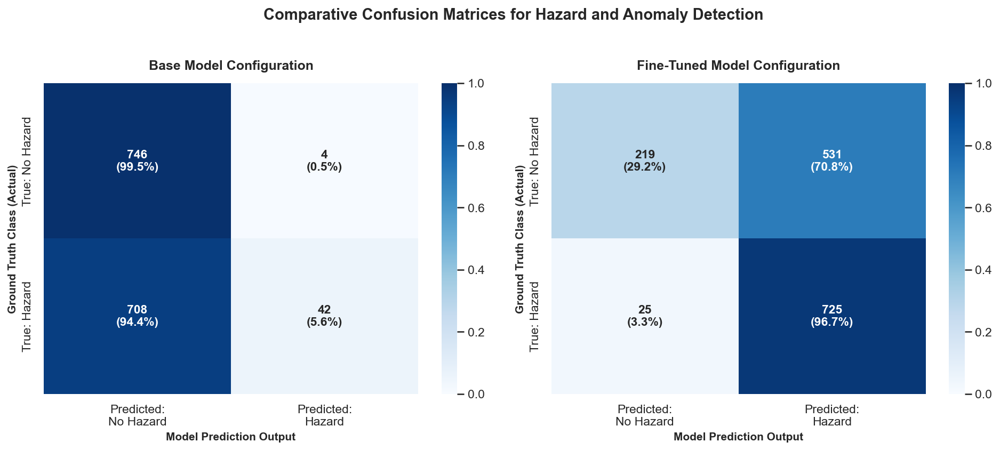

,Model,True Negatives,False Positives,False Negatives,True Positives
0,Base Model,746,4,708,42
1,Fine-Tuned Model,219,531,25,725


In [34]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

from sklearn.metrics import confusion_matrix


# Prepare the model-specific evaluation dataframes.
base_confusion_data = hazard_metric_details[
    hazard_metric_details["Model"] == "Base"
].copy()

finetuned_confusion_data = hazard_metric_details[
    hazard_metric_details["Model"] == "Fine-tuned"
].copy()


# Configure the dual-plot canvas layout.
fig, axes = plt.subplots(
    1,
    2,
    figsize=(13, 5.5),
    dpi=150,
)

models_to_plot = [
    (
        "Base Model",
        base_confusion_data,
        axes[0],
    ),
    (
        "Fine-Tuned Model",
        finetuned_confusion_data,
        axes[1],
    ),
]

confusion_matrix_records = []


for title, model_data, ax in models_to_plot:

    y_true = (
        model_data["ground_truth_hazard"]
        .astype(int)
    )

    y_pred = (
        model_data["predicted_hazard"]
        .astype(int)
    )

    target_labels = [0, 1]

    cm = confusion_matrix(
        y_true,
        y_pred,
        labels=target_labels,
    )

    tn, fp, fn, tp = cm.ravel()

    confusion_matrix_records.append(
        {
            "Model": title,
            "True Negatives": int(tn),
            "False Positives": int(fp),
            "False Negatives": int(fn),
            "True Positives": int(tp),
        }
    )

    # Zero-division-safe row-wise normalization.
    row_sums = cm.sum(axis=1)[:, np.newaxis]

    row_sums_safe = np.where(
        row_sums == 0,
        1,
        row_sums,
    )

    cm_normalized = (
        cm.astype(float)
        / row_sums_safe
    )

    # Display both raw counts and row percentages.
    group_counts = [
        f"{value:.0f}"
        for value in cm.flatten()
    ]

    group_percentages = []

    for row_index in range(2):

        row_total = cm[row_index].sum()

        for column_index in range(2):

            value = cm[
                row_index,
                column_index,
            ]

            percentage = (
                value / row_total * 100
                if row_total > 0
                else 0.0
            )

            group_percentages.append(
                f"{percentage:.1f}%"
            )

    annotation_labels = [
        f"{count}\n({percentage})"
        for count, percentage in zip(
            group_counts,
            group_percentages,
        )
    ]

    annotation_labels = np.asarray(
        annotation_labels
    ).reshape(2, 2)

    sns.heatmap(
        cm_normalized,
        annot=annotation_labels,
        fmt="",
        cmap="Blues",
        cbar=True,
        vmin=0,
        vmax=1,
        xticklabels=[
            "Predicted:\nNo Hazard",
            "Predicted:\nHazard",
        ],
        yticklabels=[
            "True: No Hazard",
            "True: Hazard",
        ],
        annot_kws={
            "size": 11,
            "weight": "bold",
        },
        ax=ax,
    )

    ax.set_title(
        f"{title} Configuration",
        fontsize=12,
        fontweight="bold",
        pad=12,
    )

    ax.set_ylabel(
        "Ground Truth Class (Actual)",
        fontsize=10,
        fontweight="bold",
    )

    ax.set_xlabel(
        "Model Prediction Output",
        fontsize=10,
        fontweight="bold",
    )


plt.suptitle(
    "Comparative Confusion Matrices for "
    "Hazard and Anomaly Detection",
    fontsize=14,
    fontweight="bold",
    y=1.02,
)

plt.tight_layout()
plt.show()


# Store the four confusion-matrix components.
hazard_confusion_matrix_results = pd.DataFrame(
    confusion_matrix_records
)

display(
    hazard_confusion_matrix_results
)

**XAI WOrkflow**

**XAI Matched Sample pool**

In [ ]:
import pandas as pd


# Retrieve the binary correctness information calculated earlier.
base_xai_results = (
    base_hazard_metric_details[
        [
            "evaluation_id",
            "ground_truth_hazard",
            "predicted_hazard",
            "correct",
        ]
    ]
    .rename(
        columns={
            "predicted_hazard": "base_prediction",
            "correct": "base_correct",
        }
    )
)


finetuned_xai_results = (
    finetuned_hazard_metric_details[
        [
            "evaluation_id",
            "predicted_hazard",
            "correct",
        ]
    ]
    .rename(
        columns={
            "predicted_hazard": "finetuned_prediction",
            "correct": "finetuned_correct",
        }
    )
)


# Start from the original hazard dataframe so that image paths, instructions and ground truths are retained.
xai_sample_pool = (
    base_hazard[
        [
            "evaluation_id",
            "image_path",
            "instruction",
            "ground_truth_anomaly",
            "ground_truth_text",
            "predicted_output",
        ]
    ]
    .rename(
        columns={
            "predicted_output": "base_output",
        }
    )
)


# Add the fine-tuned textual output.
xai_sample_pool = xai_sample_pool.merge(
    finetuned_hazard[
        [
            "evaluation_id",
            "predicted_output",
        ]
    ].rename(
        columns={
            "predicted_output": "finetuned_output",
        }
    ),
    on="evaluation_id",
    how="inner",
)


# Add the parsed correctness information.
xai_sample_pool = xai_sample_pool.merge(
    base_xai_results,
    on="evaluation_id",
    how="inner",
)

xai_sample_pool = xai_sample_pool.merge(
    finetuned_xai_results,
    on="evaluation_id",
    how="inner",
)


# Categorize how fine-tuning changed each matched prediction.
def classify_xai_case(row):

    if (
        row["base_correct"]
        and row["finetuned_correct"]
    ):
        return "Both Correct"

    if (
        not row["base_correct"]
        and row["finetuned_correct"]
    ):
        return "Fine-Tuned Improvement"

    if (
        row["base_correct"]
        and not row["finetuned_correct"]
    ):
        return "Fine-Tuned Regression"

    return "Both Incorrect"


xai_sample_pool["comparison_case"] = (
    xai_sample_pool.apply(
        classify_xai_case,
        axis=1,
    )
)


print("Available XAI comparison cases:")

display(
    xai_sample_pool[
        "comparison_case"
    ]
    .value_counts()
    .rename_axis("Comparison Case")
    .reset_index(name="Number of Samples")
)

Available XAI comparison cases:


,Comparison Case,Number of Samples
0,Fine-Tuned Improvement,683
1,Fine-Tuned Regression,527
2,Both Correct,261
3,Both Incorrect,29


**Inspect hazard distribution within each XAI group**

In [40]:
xai_case_distribution = pd.crosstab(
    xai_sample_pool["comparison_case"],
    xai_sample_pool["ground_truth_hazard"],
)

xai_case_distribution = (
    xai_case_distribution
    .rename(
        columns={
            0: "No Hazard",
            1: "Hazard Present",
        }
    )
)

xai_case_distribution["Total"] = (
    xai_case_distribution.sum(axis=1)
)

display(xai_case_distribution)

ground_truth_hazard,No Hazard,Hazard Present,Total
comparison_case,,,
Both Correct,219,42,261
Both Incorrect,4,25,29
Fine-Tuned Improvement,0,683,683
Fine-Tuned Regression,527,0,527


**Select representative XAI cases**

In [41]:
# Reproducibly select representative cases for XAI analysis.

xai_selected_samples = pd.concat(
    [
        xai_sample_pool[
            xai_sample_pool["comparison_case"]
            == "Fine-Tuned Improvement"
        ].sample(
            n=2,
            random_state=42,
        ),

        xai_sample_pool[
            xai_sample_pool["comparison_case"]
            == "Fine-Tuned Regression"
        ].sample(
            n=2,
            random_state=42,
        ),

        xai_sample_pool[
            xai_sample_pool["comparison_case"]
            == "Both Correct"
        ].sample(
            n=1,
            random_state=42,
        ),

        xai_sample_pool[
            xai_sample_pool["comparison_case"]
            == "Both Incorrect"
        ].sample(
            n=1,
            random_state=42,
        ),
    ],
    ignore_index=True,
)


display(
    xai_selected_samples[
        [
            "evaluation_id",
            "comparison_case",
            "ground_truth_hazard",
            "base_prediction",
            "finetuned_prediction",
            "image_path",
        ]
    ]
)

,evaluation_id,comparison_case,ground_truth_hazard,base_prediction,finetuned_prediction,image_path
0,hazard_and_anomaly_detection::had_pos_0316,Fine-Tuned Improvement,1,0,1,val/images/c08bf392-3d39a1bc.jpg
1,hazard_and_anomaly_detection::had_pos_0297,Fine-Tuned Improvement,1,0,1,val/images/bdf33dc4-ae128055.jpg
2,hazard_and_anomaly_detection::had_neg_0309,Fine-Tuned Regression,0,0,1,val/images/b95feaae-690faa76.jpg
3,hazard_and_anomaly_detection::had_neg_0633,Fine-Tuned Regression,0,0,1,val/images/bca562b0-3ae25344.jpg
4,hazard_and_anomaly_detection::had_pos_0109,Both Correct,1,1,1,val/images/c427410f-3ddc8e2f.jpg
5,hazard_and_anomaly_detection::had_pos_0570,Both Incorrect,1,0,0,val/images/b2208b0f-2796a692.jpg


**Load the base model and processor**

In [ ]:
import torch
from pathlib import Path
from transformers import (
    AutoProcessor,
    Qwen3VLForConditionalGeneration,
)

# Model paths

BASE_MODEL_ID = "Qwen/Qwen3-VL-4B-Instruct"

LORA_ADAPTER_PATH = Path(
    r"C:\Users\becker\Documents\Thesis"
    r"\qwen3vl_bdd100k_lora\final_model"
)


# Verify LoRA adapter

adapter_config = LORA_ADAPTER_PATH / "adapter_config.json"

if not adapter_config.exists():
    raise FileNotFoundError(
        f"LoRA adapter configuration not found at:\n"
        f"{adapter_config}"
    )

print("LoRA adapter found:")
print(LORA_ADAPTER_PATH)


# Load processor

processor = AutoProcessor.from_pretrained(
    BASE_MODEL_ID
)


# Load base Qwen3-VL model

base_model = (
    Qwen3VLForConditionalGeneration
    .from_pretrained(
        BASE_MODEL_ID,
        torch_dtype="auto",
        device_map="auto",

        # Important for XAI attention extraction.
        attn_implementation="eager",
    )
)

base_model.eval()


print("\nBase model loaded successfully.")
print(
    "Model class:",
    base_model.__class__.__name__,
)

print(
    "Processor class:",
    processor.__class__.__name__,
)

LoRA adapter found:
C:\Users\becker\Documents\Thesis\qwen3vl_bdd100k_lora\final_model


`torch_dtype` is deprecated! Use `dtype` instead!


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]


Base model loaded successfully.
Model class: Qwen3VLForConditionalGeneration
Processor class: Qwen3VLProcessor


**Attach the LoRA adapter**

In [46]:
from peft import PeftModel

# Attach the trained LoRA adapter to the base model.
xai_model = PeftModel.from_pretrained(
    base_model,
    str(LORA_ADAPTER_PATH),
    is_trainable=False,
)

xai_model.eval()

print("LoRA adapter loaded successfully.")
print("Model class:", xai_model.__class__.__name__)

print("\nLoaded adapters:")
print(xai_model.peft_config.keys())

print("\nActive adapters:")
print(xai_model.active_adapters)

LoRA adapter loaded successfully.
Model class: PeftModelForCausalLM

Loaded adapters:
dict_keys(['default'])

Active adapters:
['default']


**Visual Attention Maps**

**Scene A — Fine-Tuned Improvement**

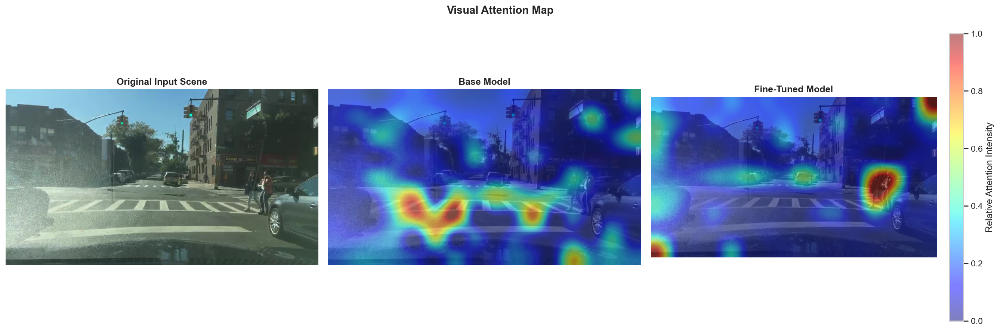

Evaluation ID:
hazard_and_anomaly_detection::had_pos_0316

Ground Truth:
A visible person is within 1 pixels of the directly drivable area in the lower portion of the image.

Base Model Output:
Decision: No

Hazard Type: None

Involved Objects: None

Location: None

Severity: None

Visible Evidence: The image shows a typical urban street intersection with crosswalks, traffic lights, and vehicles. There are pedestrians on the sidewalk near the crosswalk, but they are not in the directly

Fine-Tuned Model Output:
Potential hazard: 2 pedestrian(s)/rider(s) near the roadway; 12 vehicle(s) that may affect traffic flow.


In [ ]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt

from pathlib import Path
from PIL import Image
from qwen_vl_utils import process_vision_info



# Select reproducible example

SCENE_ID = "hazard_and_anomaly_detection::had_pos_0316"

xai_sample = (
    xai_sample_pool[
        xai_sample_pool["evaluation_id"] == SCENE_ID
    ]
    .iloc[0]
    .copy()
)

image_path = IMAGE_ROOT / Path(
    xai_sample["image_path"]
)

image = Image.open(
    image_path
).convert("RGB")


# Prepare model input

messages = [
    {
        "role": "user",
        "content": [
            {
                "type": "image",
                "image": str(image_path),
                "min_pixels": 256 * 256,
                "max_pixels": 384 * 384,
            },
            {
                "type": "text",
                "text": str(
                    xai_sample["instruction"]
                ),
            },
        ],
    }
]

text_prompt = processor.apply_chat_template(
    messages,
    tokenize=False,
    add_generation_prompt=True,
)

image_inputs, video_inputs = (
    process_vision_info(messages)
)

inputs = processor(
    text=[text_prompt],
    images=image_inputs,
    videos=video_inputs,
    padding=True,
    return_tensors="pt",
)

model_device = next(
    xai_model.parameters()
).device

inputs = {
    key: (
        value.to(model_device)
        if isinstance(value, torch.Tensor)
        else value
    )
    for key, value in inputs.items()
}

prompt_length = inputs["input_ids"].shape[1]



# Base Model inference

with torch.no_grad():

    with xai_model.disable_adapter():

        base_generated_ids = xai_model.generate(
            **inputs,
            max_new_tokens=64,
            do_sample=False,
            use_cache=True,
        )

# Fine-Tuned Model inference

with torch.no_grad():

    finetuned_generated_ids = xai_model.generate(
        **inputs,
        max_new_tokens=64,
        do_sample=False,
        use_cache=True,
    )


# Decode model outputs

base_output = processor.batch_decode(
    base_generated_ids[:, prompt_length:],
    skip_special_tokens=True,
    clean_up_tokenization_spaces=False,
)[0].strip()

finetuned_output = processor.batch_decode(
    finetuned_generated_ids[:, prompt_length:],
    skip_special_tokens=True,
    clean_up_tokenization_spaces=False,
)[0].strip()


# Determine visual-token grid

spatial_merge_size = int(
    xai_model.config.vision_config.spatial_merge_size
)

_, grid_h, grid_w = (
    inputs["image_grid_thw"][0]
    .detach()
    .cpu()
    .tolist()
)

attention_grid_h = (
    grid_h // spatial_merge_size
)

attention_grid_w = (
    grid_w // spatial_merge_size
)

image_token_id = (
    xai_model.config.image_token_id
)

image_token_positions = (
    (
        inputs["input_ids"][0]
        == image_token_id
    )
    .nonzero(as_tuple=True)[0]
)


# Attention extraction

def extract_attention(
    generated_ids,
    use_adapter,
    last_n_layers=4,
):

    generated_ids = generated_ids.to(
        model_device
    )

    full_attention_mask = torch.ones_like(
        generated_ids,
        device=model_device,
    )

    forward_inputs = {
        "input_ids": generated_ids,
        "attention_mask": full_attention_mask,
        "pixel_values": inputs["pixel_values"],
        "image_grid_thw": inputs["image_grid_thw"],
        "output_attentions": True,
        "use_cache": False,
        "return_dict": True,
    }

    with torch.no_grad():

        if use_adapter:

            outputs = xai_model(
                **forward_inputs
            )

        else:

            with xai_model.disable_adapter():

                outputs = xai_model(
                    **forward_inputs
                )

    response_positions = torch.arange(
        prompt_length,
        generated_ids.shape[1],
        device=model_device,
    )

    layer_maps = []

    for attention in outputs.attentions[
        -last_n_layers:
    ]:

        # Batch 0
        attention = attention[0]

        # Generated response -> image tokens
        visual_attention = attention[
            :,
            response_positions,
            :
        ][
            :,
            :,
            image_token_positions,
        ]

        # Average heads and generated tokens
        visual_attention = (
            visual_attention
            .mean(dim=0)
            .mean(dim=0)
        )

        layer_maps.append(
            visual_attention
        )

    attention_vector = torch.stack(
        layer_maps
    ).mean(dim=0)

    return (
        attention_vector
        .float()
        .cpu()
        .numpy()
        .reshape(
            attention_grid_h,
            attention_grid_w,
        )
    )


base_attention = extract_attention(
    base_generated_ids,
    use_adapter=False,
)

finetuned_attention = extract_attention(
    finetuned_generated_ids,
    use_adapter=True,
)


# Normalize attention maps

def normalize_map(attention_map):

    minimum = attention_map.min()
    maximum = attention_map.max()

    return (
        (attention_map - minimum)
        / (maximum - minimum + 1e-8)
    )


base_attention = normalize_map(
    base_attention
)

finetuned_attention = normalize_map(
    finetuned_attention
)


# Resize to original image dimensions

original_image = np.array(image)

image_h, image_w = (
    original_image.shape[:2]
)

base_heatmap = cv2.resize(
    base_attention,
    (image_w, image_h),
    interpolation=cv2.INTER_CUBIC,
)

finetuned_heatmap = cv2.resize(
    finetuned_attention,
    (image_w, image_h),
    interpolation=cv2.INTER_CUBIC,
)


# Final visualization

fig, axes = plt.subplots(
    1,
    3,
    figsize=(18, 6),
    dpi=150,
)

axes[0].imshow(original_image)
axes[0].set_title(
    "Original Input Scene",
    fontweight="bold",
)
axes[0].axis("off")


axes[1].imshow(original_image)

axes[1].imshow(
    base_heatmap,
    cmap="jet",
    alpha=0.50,
    vmin=0,
    vmax=1,
)

axes[1].set_title(
    "Base Model",
    fontweight="bold",
)

axes[1].axis("off")


axes[2].imshow(original_image)

fine_plot = axes[2].imshow(
    finetuned_heatmap,
    cmap="jet",
    alpha=0.50,
    vmin=0,
    vmax=1,
)

axes[2].set_title(
    "Fine-Tuned Model",
    fontweight="bold",
)

axes[2].axis("off")


cbar = fig.colorbar(
    fine_plot,
    ax=axes[2],
    fraction=0.046,
    pad=0.04,
)

cbar.set_label(
    "Relative Attention Intensity"
)

plt.suptitle(
    "Visual Attention Map",
    fontsize=14,
    fontweight="bold",
)

plt.tight_layout()
plt.show()


# Model responses

print("Evaluation ID:")
print(SCENE_ID)

print("\nGround Truth:")
print(xai_sample["ground_truth_text"])

print("\nBase Model Output:")
print(base_output)

print("\nFine-Tuned Model Output:")
print(finetuned_output)

**Scene B — Fine-Tuned Regression**

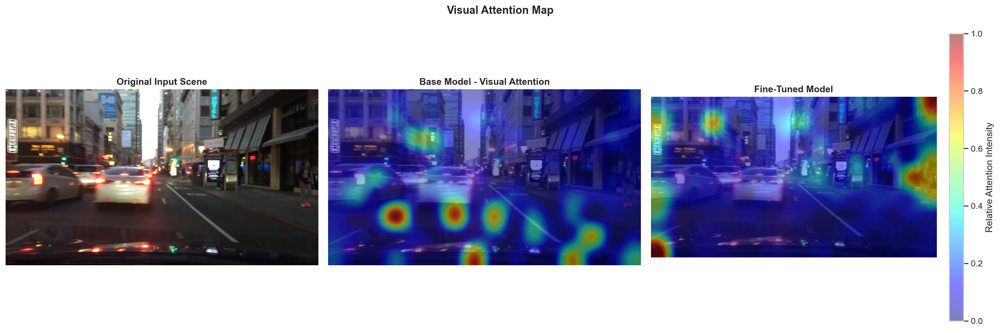

Evaluation ID:
hazard_and_anomaly_detection::had_neg_0392

User Prompt:
Determine whether the image contains a rule-defined visible potential hazard: either a sufficiently large vulnerable road user very near the directly drivable area, or a large close vehicle occupying the central directly drivable area. Return the decision, hazard type, involved objects, location, severity, and visible evidence.

Ground Truth:
No rule-defined potential hazard is present: no sufficiently large vulnerable road user is near the directly drivable area and no large close vehicle occupies its central lower region.

Base Model Output:
Decision: No

Hazard Type: None

Involved Objects: None

Location: None

Severity: None

Visible Evidence: The image shows a typical urban street scene with vehicles in motion, including a white sedan directly ahead in the central drivable area and other cars to the left. There are no visible vulnerable

Fine-Tuned Model Output:
Potential hazard: 1 pedestrian(s)/rider(s) near

In [ ]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt

from pathlib import Path
from PIL import Image
from qwen_vl_utils import process_vision_info



# Select reproducible example

SCENE_ID = "hazard_and_anomaly_detection::had_neg_0392"

xai_sample = (
    xai_sample_pool[
        xai_sample_pool["evaluation_id"] == SCENE_ID
    ]
    .iloc[0]
    .copy()
)

image_path = IMAGE_ROOT / Path(
    xai_sample["image_path"]
)

image = Image.open(
    image_path
).convert("RGB")


# Prepare model input

query_text = str(
    xai_sample["instruction"]
)

messages = [
    {
        "role": "user",
        "content": [
            {
                "type": "image",
                "image": str(image_path),
                "min_pixels": 256 * 256,
                "max_pixels": 384 * 384,
            },
            {
                "type": "text",
                "text": query_text,
            },
        ],
    }
]

text_prompt = processor.apply_chat_template(
    messages,
    tokenize=False,
    add_generation_prompt=True,
)

image_inputs, video_inputs = (
    process_vision_info(messages)
)

inputs = processor(
    text=[text_prompt],
    images=image_inputs,
    videos=video_inputs,
    padding=True,
    return_tensors="pt",
)

model_device = next(
    xai_model.parameters()
).device

inputs = {
    key: (
        value.to(model_device)
        if isinstance(value, torch.Tensor)
        else value
    )
    for key, value in inputs.items()
}

prompt_length = inputs["input_ids"].shape[1]


# Base Model inference

with torch.no_grad():

    with xai_model.disable_adapter():

        base_generated_ids = xai_model.generate(
            **inputs,
            max_new_tokens=64,
            do_sample=False,
            use_cache=True,
        )


# Fine-Tuned Model inference

with torch.no_grad():

    finetuned_generated_ids = xai_model.generate(
        **inputs,
        max_new_tokens=64,
        do_sample=False,
        use_cache=True,
    )


# Decode outputs

base_output = processor.batch_decode(
    base_generated_ids[:, prompt_length:],
    skip_special_tokens=True,
    clean_up_tokenization_spaces=False,
)[0].strip()

finetuned_output = processor.batch_decode(
    finetuned_generated_ids[:, prompt_length:],
    skip_special_tokens=True,
    clean_up_tokenization_spaces=False,
)[0].strip()


# Determine visual-token grid

spatial_merge_size = int(
    xai_model.config.vision_config.spatial_merge_size
)

_, grid_h, grid_w = (
    inputs["image_grid_thw"][0]
    .detach()
    .cpu()
    .tolist()
)

attention_grid_h = (
    grid_h // spatial_merge_size
)

attention_grid_w = (
    grid_w // spatial_merge_size
)

image_token_id = (
    xai_model.config.image_token_id
)

image_token_positions = (
    (
        inputs["input_ids"][0]
        == image_token_id
    )
    .nonzero(as_tuple=True)[0]
)

# Extract visual attention

def extract_attention(
    generated_ids,
    use_adapter,
    last_n_layers=4,
):

    generated_ids = generated_ids.to(
        model_device
    )

    full_attention_mask = torch.ones_like(
        generated_ids,
        device=model_device,
    )

    forward_inputs = {
        "input_ids": generated_ids,
        "attention_mask": full_attention_mask,
        "pixel_values": inputs["pixel_values"],
        "image_grid_thw": inputs["image_grid_thw"],
        "output_attentions": True,
        "use_cache": False,
        "return_dict": True,
    }

    with torch.no_grad():

        if use_adapter:

            outputs = xai_model(
                **forward_inputs
            )

        else:

            with xai_model.disable_adapter():

                outputs = xai_model(
                    **forward_inputs
                )

    response_positions = torch.arange(
        prompt_length,
        generated_ids.shape[1],
        device=model_device,
    )

    layer_maps = []

    for attention in outputs.attentions[
        -last_n_layers:
    ]:

        attention = attention[0]

        visual_attention = attention[
            :,
            response_positions,
            :
        ][
            :,
            :,
            image_token_positions,
        ]

        visual_attention = (
            visual_attention
            .mean(dim=0)
            .mean(dim=0)
        )

        layer_maps.append(
            visual_attention
        )

    attention_vector = torch.stack(
        layer_maps
    ).mean(dim=0)

    return (
        attention_vector
        .float()
        .cpu()
        .numpy()
        .reshape(
            attention_grid_h,
            attention_grid_w,
        )
    )


base_attention = extract_attention(
    base_generated_ids,
    use_adapter=False,
)

finetuned_attention = extract_attention(
    finetuned_generated_ids,
    use_adapter=True,
)


# Normalize maps

def normalize_map(attention_map):

    minimum = attention_map.min()
    maximum = attention_map.max()

    return (
        (attention_map - minimum)
        / (maximum - minimum + 1e-8)
    )


base_attention = normalize_map(
    base_attention
)

finetuned_attention = normalize_map(
    finetuned_attention
)

# Resize to original image

original_image = np.array(image)

image_h, image_w = (
    original_image.shape[:2]
)

base_heatmap = cv2.resize(
    base_attention,
    (image_w, image_h),
    interpolation=cv2.INTER_CUBIC,
)

finetuned_heatmap = cv2.resize(
    finetuned_attention,
    (image_w, image_h),
    interpolation=cv2.INTER_CUBIC,
)


# Final visualization

fig, axes = plt.subplots(
    1,
    3,
    figsize=(18, 6),
    dpi=150,
)

axes[0].imshow(original_image)
axes[0].set_title(
    "Original Input Scene",
    fontweight="bold",
)
axes[0].axis("off")


axes[1].imshow(original_image)
axes[1].imshow(
    base_heatmap,
    cmap="jet",
    alpha=0.50,
    vmin=0,
    vmax=1,
)
axes[1].set_title(
    "Base Model - Visual Attention",
    fontweight="bold",
)
axes[1].axis("off")


axes[2].imshow(original_image)

fine_plot = axes[2].imshow(
    finetuned_heatmap,
    cmap="jet",
    alpha=0.50,
    vmin=0,
    vmax=1,
)

axes[2].set_title(
    "Fine-Tuned Model",
    fontweight="bold",
)
axes[2].axis("off")


cbar = fig.colorbar(
    fine_plot,
    ax=axes[2],
    fraction=0.046,
    pad=0.04,
)

cbar.set_label(
    "Relative Attention Intensity"
)

plt.suptitle(
    "Visual Attention Map",
    fontsize=14,
    fontweight="bold",
)

plt.tight_layout()
plt.show()


# Experiment output

print("Evaluation ID:")
print(SCENE_ID)

print("\nUser Prompt:")
print(query_text)

print("\nGround Truth:")
print(xai_sample["ground_truth_text"])

print("\nBase Model Output:")
print(base_output)

print("\nFine-Tuned Model Output:")
print(finetuned_output)

**Occlusion Sensitivity Analysis**

**Scene A — Fine-Tuned Improvement**

Processing patch 40/40
Occlusion analysis complete.


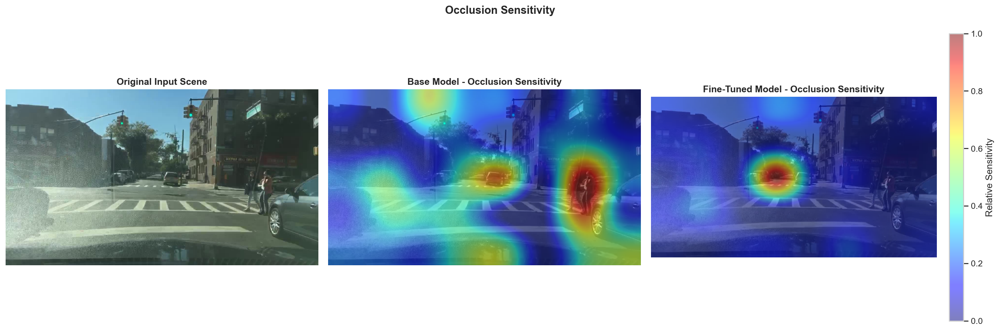


Evaluation ID:
hazard_and_anomaly_detection::had_pos_0316

User Prompt:
Determine whether the image contains a rule-defined visible potential hazard: either a sufficiently large vulnerable road user very near the directly drivable area, or a large close vehicle occupying the central directly drivable area. Return the decision, hazard type, involved objects, location, severity, and visible evidence.

Ground Truth:
A visible person is within 1 pixels of the directly drivable area in the lower portion of the image.

Base Model Output:
Decision: No

Hazard Type: None

Involved Objects: None

Location: None

Severity: None

Visible Evidence: The image shows a typical urban street intersection with crosswalks, traffic lights, and vehicles. There are pedestrians on the sidewalk near the crosswalk, but they are not in the directly

Fine-Tuned Model Output:
Potential hazard: 2 pedestrian(s)/rider(s) near the roadway; 12 vehicle(s) that may affect traffic flow.


In [ ]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt

from pathlib import Path
from PIL import Image
from qwen_vl_utils import process_vision_info

# Select reproducible example

SCENE_ID = "hazard_and_anomaly_detection::had_pos_0316"

xai_sample = (
    xai_sample_pool[
        xai_sample_pool["evaluation_id"] == SCENE_ID
    ]
    .iloc[0]
    .copy()
)

image_path = IMAGE_ROOT / Path(
    xai_sample["image_path"]
)

image = Image.open(
    image_path
).convert("RGB")

query_text = str(
    xai_sample["instruction"]
)

model_device = next(
    xai_model.parameters()
).device


# Prepare multimodal input

def prepare_input(input_image):

    messages = [
        {
            "role": "user",
            "content": [
                {
                    "type": "image",
                    "image": input_image,
                    "min_pixels": 256 * 256,
                    "max_pixels": 384 * 384,
                },
                {
                    "type": "text",
                    "text": query_text,
                },
            ],
        }
    ]

    text_prompt = processor.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True,
    )

    image_inputs, video_inputs = (
        process_vision_info(messages)
    )

    model_inputs = processor(
        text=[text_prompt],
        images=image_inputs,
        videos=video_inputs,
        padding=True,
        return_tensors="pt",
    )

    model_inputs = {
        key: (
            value.to(model_device)
            if isinstance(value, torch.Tensor)
            else value
        )
        for key, value in model_inputs.items()
    }

    return model_inputs


inputs = prepare_input(image)

prompt_length = (
    inputs["input_ids"].shape[1]
)


# Original Base Model inference

with torch.no_grad():

    with xai_model.disable_adapter():

        base_generated_ids = xai_model.generate(
            **inputs,
            max_new_tokens=64,
            do_sample=False,
            use_cache=True,
        )

# Original Fine-Tuned Model inference

with torch.no_grad():

    finetuned_generated_ids = xai_model.generate(
        **inputs,
        max_new_tokens=64,
        do_sample=False,
        use_cache=True,
    )


base_target_ids = (
    base_generated_ids[
        :,
        prompt_length:
    ]
)

finetuned_target_ids = (
    finetuned_generated_ids[
        :,
        prompt_length:
    ]
)


base_output = processor.batch_decode(
    base_target_ids,
    skip_special_tokens=True,
    clean_up_tokenization_spaces=False,
)[0].strip()


finetuned_output = processor.batch_decode(
    finetuned_target_ids,
    skip_special_tokens=True,
    clean_up_tokenization_spaces=False,
)[0].strip()


# Measures how strongly the image supports the model's original generated response.

def response_log_probability(
    input_image,
    target_ids,
    use_adapter,
):

    model_inputs = prepare_input(
        input_image
    )

    current_prompt_length = (
        model_inputs["input_ids"].shape[1]
    )

    if current_prompt_length != prompt_length:

        raise ValueError(
            "Prompt length changed during "
            "occlusion preprocessing."
        )

    target_ids = target_ids.to(
        model_device
    )

    full_input_ids = torch.cat(
        [
            model_inputs["input_ids"],
            target_ids,
        ],
        dim=1,
    )

    target_mask = torch.ones(
        (
            model_inputs[
                "attention_mask"
            ].shape[0],
            target_ids.shape[1],
        ),
        dtype=model_inputs[
            "attention_mask"
        ].dtype,
        device=model_device,
    )

    full_attention_mask = torch.cat(
        [
            model_inputs[
                "attention_mask"
            ],
            target_mask,
        ],
        dim=1,
    )

    forward_inputs = {
        "input_ids": full_input_ids,
        "attention_mask": full_attention_mask,
        "pixel_values":
            model_inputs["pixel_values"],
        "image_grid_thw":
            model_inputs["image_grid_thw"],
        "use_cache": False,
        "return_dict": True,
    }

    with torch.no_grad():

        if use_adapter:

            outputs = xai_model(
                **forward_inputs
            )

        else:

            with xai_model.disable_adapter():

                outputs = xai_model(
                    **forward_inputs
                )

    logits = outputs.logits

    # Logits predicting the generated response
    response_logits = logits[
        :,
        prompt_length - 1:
        prompt_length - 1
        + target_ids.shape[1],
        :
    ]

    log_probs = torch.log_softmax(
        response_logits,
        dim=-1,
    )

    token_log_probs = (
        log_probs
        .gather(
            dim=-1,
            index=target_ids.unsqueeze(-1),
        )
        .squeeze(-1)
    )

    return (
        token_log_probs
        .mean()
        .item()
    )

# Baseline response likelihoods

base_baseline_score = (
    response_log_probability(
        image,
        base_target_ids,
        use_adapter=False,
    )
)

finetuned_baseline_score = (
    response_log_probability(
        image,
        finetuned_target_ids,
        use_adapter=True,
    )
)


# Occlusion grid

GRID_ROWS = 5
GRID_COLS = 8

original_image = np.array(
    image
)

image_h, image_w = (
    original_image.shape[:2]
)

patch_h = int(
    np.ceil(
        image_h / GRID_ROWS
    )
)

patch_w = int(
    np.ceil(
        image_w / GRID_COLS
    )
)


# Neutral masking value:
# mean colour of the original scene
mask_value = (
    original_image
    .reshape(-1, 3)
    .mean(axis=0)
    .astype(np.uint8)
)


base_sensitivity = np.zeros(
    (GRID_ROWS, GRID_COLS),
    dtype=np.float32,
)

finetuned_sensitivity = np.zeros(
    (GRID_ROWS, GRID_COLS),
    dtype=np.float32,
)


# Run occlusion experiment

total_patches = (
    GRID_ROWS * GRID_COLS
)

patch_number = 0


for row in range(GRID_ROWS):

    for col in range(GRID_COLS):

        patch_number += 1

        print(
            f"\rProcessing patch "
            f"{patch_number}/{total_patches}",
            end="",
        )

        y1 = row * patch_h
        y2 = min(
            (row + 1) * patch_h,
            image_h,
        )

        x1 = col * patch_w
        x2 = min(
            (col + 1) * patch_w,
            image_w,
        )


        occluded_array = (
            original_image.copy()
        )

        occluded_array[
            y1:y2,
            x1:x2,
        ] = mask_value

        occluded_image = Image.fromarray(
            occluded_array
        )


        # Base Model
        base_occluded_score = (
            response_log_probability(
                occluded_image,
                base_target_ids,
                use_adapter=False,
            )
        )

        base_drop = (
            base_baseline_score
            - base_occluded_score
        )

        base_sensitivity[
            row,
            col
        ] = max(
            base_drop,
            0.0,
        )


        # Fine-Tuned Model
        finetuned_occluded_score = (
            response_log_probability(
                occluded_image,
                finetuned_target_ids,
                use_adapter=True,
            )
        )

        finetuned_drop = (
            finetuned_baseline_score
            - finetuned_occluded_score
        )

        finetuned_sensitivity[
            row,
            col
        ] = max(
            finetuned_drop,
            0.0,
        )


print("\nOcclusion analysis complete.")


# Normalize sensitivity maps

def normalize_sensitivity(
    sensitivity_map
):

    minimum = sensitivity_map.min()
    maximum = sensitivity_map.max()

    return (
        (sensitivity_map - minimum)
        /
        (
            maximum
            - minimum
            + 1e-8
        )
    )


base_sensitivity_norm = (
    normalize_sensitivity(
        base_sensitivity
    )
)

finetuned_sensitivity_norm = (
    normalize_sensitivity(
        finetuned_sensitivity
    )
)

# Resize maps to image dimensions

base_occlusion_heatmap = cv2.resize(
    base_sensitivity_norm,
    (image_w, image_h),
    interpolation=cv2.INTER_CUBIC,
)

finetuned_occlusion_heatmap = (
    cv2.resize(
        finetuned_sensitivity_norm,
        (image_w, image_h),
        interpolation=cv2.INTER_CUBIC,
    )
)


# Final visualization

fig, axes = plt.subplots(
    1,
    3,
    figsize=(18, 6),
    dpi=150,
)


axes[0].imshow(
    original_image
)

axes[0].set_title(
    "Original Input Scene",
    fontweight="bold",
)

axes[0].axis("off")


axes[1].imshow(
    original_image
)

axes[1].imshow(
    base_occlusion_heatmap,
    cmap="jet",
    alpha=0.50,
    vmin=0,
    vmax=1,
)

axes[1].set_title(
    "Base Model - Occlusion Sensitivity",
    fontweight="bold",
)

axes[1].axis("off")


axes[2].imshow(
    original_image
)

fine_plot = axes[2].imshow(
    finetuned_occlusion_heatmap,
    cmap="jet",
    alpha=0.50,
    vmin=0,
    vmax=1,
)

axes[2].set_title(
    "Fine-Tuned Model - Occlusion Sensitivity",
    fontweight="bold",
)

axes[2].axis("off")


cbar = fig.colorbar(
    fine_plot,
    ax=axes[2],
    fraction=0.046,
    pad=0.04,
)

cbar.set_label(
    "Relative Sensitivity"
)


plt.suptitle(
    "Occlusion Sensitivity",
    fontsize=14,
    fontweight="bold",
)

plt.tight_layout()
plt.show()


# Experiment output

print("\nEvaluation ID:")
print(SCENE_ID)

print("\nUser Prompt:")
print(query_text)

print("\nGround Truth:")
print(
    xai_sample[
        "ground_truth_text"
    ]
)

print("\nBase Model Output:")
print(base_output)

print("\nFine-Tuned Model Output:")
print(finetuned_output)

**Scene B — Fine-Tuned Regression**

Processing patch 40/40
Occlusion analysis complete.


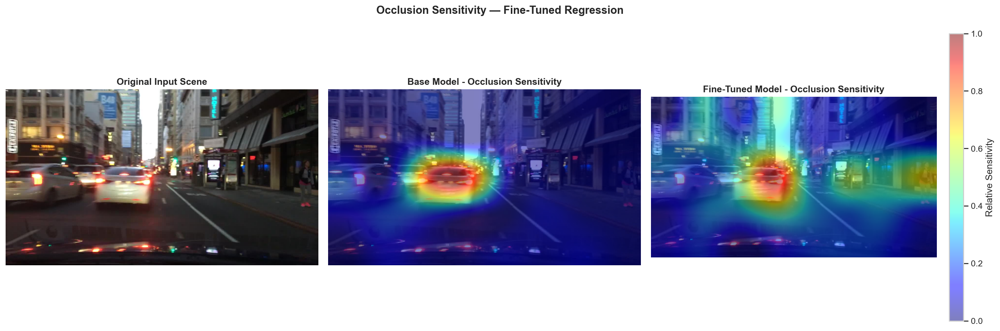


Evaluation ID:
hazard_and_anomaly_detection::had_neg_0392

User Prompt:
Determine whether the image contains a rule-defined visible potential hazard: either a sufficiently large vulnerable road user very near the directly drivable area, or a large close vehicle occupying the central directly drivable area. Return the decision, hazard type, involved objects, location, severity, and visible evidence.

Ground Truth:
No rule-defined potential hazard is present: no sufficiently large vulnerable road user is near the directly drivable area and no large close vehicle occupies its central lower region.

Base Model Output:
Decision: No

Hazard Type: None

Involved Objects: None

Location: None

Severity: None

Visible Evidence: The image shows a typical urban street scene with vehicles in motion, including a white sedan directly ahead in the central drivable area and other cars to the left. There are no visible vulnerable

Fine-Tuned Model Output:
Potential hazard: 1 pedestrian(s)/rider(s) nea

In [ ]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt

from pathlib import Path
from PIL import Image
from qwen_vl_utils import process_vision_info


# Select reproducible example

SCENE_ID = "hazard_and_anomaly_detection::had_neg_0392"

xai_sample = (
    xai_sample_pool[
        xai_sample_pool["evaluation_id"] == SCENE_ID
    ]
    .iloc[0]
    .copy()
)

image_path = IMAGE_ROOT / Path(
    xai_sample["image_path"]
)

image = Image.open(
    image_path
).convert("RGB")

query_text = str(
    xai_sample["instruction"]
)

model_device = next(
    xai_model.parameters()
).device


# Prepare multimodal input

def prepare_input(input_image):

    messages = [
        {
            "role": "user",
            "content": [
                {
                    "type": "image",
                    "image": input_image,
                    "min_pixels": 256 * 256,
                    "max_pixels": 384 * 384,
                },
                {
                    "type": "text",
                    "text": query_text,
                },
            ],
        }
    ]

    text_prompt = processor.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True,
    )

    image_inputs, video_inputs = (
        process_vision_info(messages)
    )

    model_inputs = processor(
        text=[text_prompt],
        images=image_inputs,
        videos=video_inputs,
        padding=True,
        return_tensors="pt",
    )

    return {
        key: (
            value.to(model_device)
            if isinstance(value, torch.Tensor)
            else value
        )
        for key, value in model_inputs.items()
    }


inputs = prepare_input(image)

prompt_length = (
    inputs["input_ids"].shape[1]
)


# Original model inference

with torch.no_grad():

    with xai_model.disable_adapter():

        base_generated_ids = xai_model.generate(
            **inputs,
            max_new_tokens=64,
            do_sample=False,
            use_cache=True,
        )


with torch.no_grad():

    finetuned_generated_ids = xai_model.generate(
        **inputs,
        max_new_tokens=64,
        do_sample=False,
        use_cache=True,
    )


base_target_ids = (
    base_generated_ids[
        :,
        prompt_length:
    ]
)

finetuned_target_ids = (
    finetuned_generated_ids[
        :,
        prompt_length:
    ]
)


base_output = processor.batch_decode(
    base_target_ids,
    skip_special_tokens=True,
    clean_up_tokenization_spaces=False,
)[0].strip()


finetuned_output = processor.batch_decode(
    finetuned_target_ids,
    skip_special_tokens=True,
    clean_up_tokenization_spaces=False,
)[0].strip()


def response_log_probability(
    input_image,
    target_ids,
    use_adapter,
):

    model_inputs = prepare_input(
        input_image
    )

    target_ids = target_ids.to(
        model_device
    )

    full_input_ids = torch.cat(
        [
            model_inputs["input_ids"],
            target_ids,
        ],
        dim=1,
    )

    target_mask = torch.ones(
        (
            1,
            target_ids.shape[1],
        ),
        dtype=model_inputs[
            "attention_mask"
        ].dtype,
        device=model_device,
    )

    full_attention_mask = torch.cat(
        [
            model_inputs["attention_mask"],
            target_mask,
        ],
        dim=1,
    )

    forward_inputs = {
        "input_ids":
            full_input_ids,
        "attention_mask":
            full_attention_mask,
        "pixel_values":
            model_inputs["pixel_values"],
        "image_grid_thw":
            model_inputs["image_grid_thw"],
        "use_cache": False,
        "return_dict": True,
    }

    with torch.no_grad():

        if use_adapter:

            outputs = xai_model(
                **forward_inputs
            )

        else:

            with xai_model.disable_adapter():

                outputs = xai_model(
                    **forward_inputs
                )

    response_logits = outputs.logits[
        :,
        prompt_length - 1:
        prompt_length - 1
        + target_ids.shape[1],
        :
    ]

    log_probs = torch.log_softmax(
        response_logits,
        dim=-1,
    )

    token_log_probs = (
        log_probs
        .gather(
            dim=-1,
            index=target_ids.unsqueeze(-1),
        )
        .squeeze(-1)
    )

    return (
        token_log_probs
        .mean()
        .item()
    )


base_baseline_score = (
    response_log_probability(
        image,
        base_target_ids,
        use_adapter=False,
    )
)

finetuned_baseline_score = (
    response_log_probability(
        image,
        finetuned_target_ids,
        use_adapter=True,
    )
)


# Occlusion configuration

GRID_ROWS = 5
GRID_COLS = 8

original_image = np.array(
    image
)

image_h, image_w = (
    original_image.shape[:2]
)

patch_h = int(
    np.ceil(
        image_h / GRID_ROWS
    )
)

patch_w = int(
    np.ceil(
        image_w / GRID_COLS
    )
)


# Neutral mean-colour mask
mask_value = (
    original_image
    .reshape(-1, 3)
    .mean(axis=0)
    .astype(np.uint8)
)


base_sensitivity = np.zeros(
    (GRID_ROWS, GRID_COLS),
    dtype=np.float32,
)

finetuned_sensitivity = np.zeros(
    (GRID_ROWS, GRID_COLS),
    dtype=np.float32,
)


# Occlusion experiment


total_patches = (
    GRID_ROWS * GRID_COLS
)

patch_number = 0


for row in range(GRID_ROWS):

    for col in range(GRID_COLS):

        patch_number += 1

        print(
            f"\rProcessing patch "
            f"{patch_number}/{total_patches}",
            end="",
        )

        y1 = row * patch_h

        y2 = min(
            (row + 1) * patch_h,
            image_h,
        )

        x1 = col * patch_w

        x2 = min(
            (col + 1) * patch_w,
            image_w,
        )


        # Create occluded scene
        occluded_array = (
            original_image.copy()
        )

        occluded_array[
            y1:y2,
            x1:x2,
        ] = mask_value

        occluded_image = (
            Image.fromarray(
                occluded_array
            )
        )


        # Base Model
        base_occluded_score = (
            response_log_probability(
                occluded_image,
                base_target_ids,
                use_adapter=False,
            )
        )

        base_drop = (
            base_baseline_score
            - base_occluded_score
        )

        base_sensitivity[
            row,
            col
        ] = max(
            base_drop,
            0.0,
        )


        # Fine-Tuned Model
        finetuned_occluded_score = (
            response_log_probability(
                occluded_image,
                finetuned_target_ids,
                use_adapter=True,
            )
        )

        finetuned_drop = (
            finetuned_baseline_score
            - finetuned_occluded_score
        )

        finetuned_sensitivity[
            row,
            col
        ] = max(
            finetuned_drop,
            0.0,
        )


print(
    "\nOcclusion analysis complete."
)


# Normalize sensitivity maps

def normalize_sensitivity(
    sensitivity_map
):

    minimum = (
        sensitivity_map.min()
    )

    maximum = (
        sensitivity_map.max()
    )

    return (
        (sensitivity_map - minimum)
        /
        (
            maximum
            - minimum
            + 1e-8
        )
    )


base_sensitivity_norm = (
    normalize_sensitivity(
        base_sensitivity
    )
)

finetuned_sensitivity_norm = (
    normalize_sensitivity(
        finetuned_sensitivity
    )
)


# Resize sensitivity maps

base_occlusion_heatmap = cv2.resize(
    base_sensitivity_norm,
    (image_w, image_h),
    interpolation=cv2.INTER_CUBIC,
)


finetuned_occlusion_heatmap = cv2.resize(
    finetuned_sensitivity_norm,
    (image_w, image_h),
    interpolation=cv2.INTER_CUBIC,
)


# Final visualization

fig, axes = plt.subplots(
    1,
    3,
    figsize=(18, 6),
    dpi=150,
)


axes[0].imshow(
    original_image
)

axes[0].set_title(
    "Original Input Scene",
    fontweight="bold",
)

axes[0].axis("off")


axes[1].imshow(
    original_image
)

axes[1].imshow(
    base_occlusion_heatmap,
    cmap="jet",
    alpha=0.50,
    vmin=0,
    vmax=1,
)

axes[1].set_title(
    "Base Model - Occlusion Sensitivity",
    fontweight="bold",
)

axes[1].axis("off")


axes[2].imshow(
    original_image
)

fine_plot = axes[2].imshow(
    finetuned_occlusion_heatmap,
    cmap="jet",
    alpha=0.50,
    vmin=0,
    vmax=1,
)

axes[2].set_title(
    "Fine-Tuned Model - Occlusion Sensitivity",
    fontweight="bold",
)

axes[2].axis("off")


cbar = fig.colorbar(
    fine_plot,
    ax=axes[2],
    fraction=0.046,
    pad=0.04,
)

cbar.set_label(
    "Relative Sensitivity"
)


plt.suptitle(
    "Occlusion Sensitivity - Fine-Tuned Regression",
    fontsize=14,
    fontweight="bold",
)

plt.tight_layout()
plt.show()


# Experiment output

print("\nEvaluation ID:")
print(SCENE_ID)

print("\nUser Prompt:")
print(query_text)

print("\nGround Truth:")
print(
    xai_sample[
        "ground_truth_text"
    ]
)

print("\nBase Model Output:")
print(base_output)

print("\nFine-Tuned Model Output:")
print(finetuned_output)

**Multimodal Grad-CAM**

**Scene A — Fine-Tuned Improvement**

Grad-CAM target module:
base_model.model.model.visual.merger


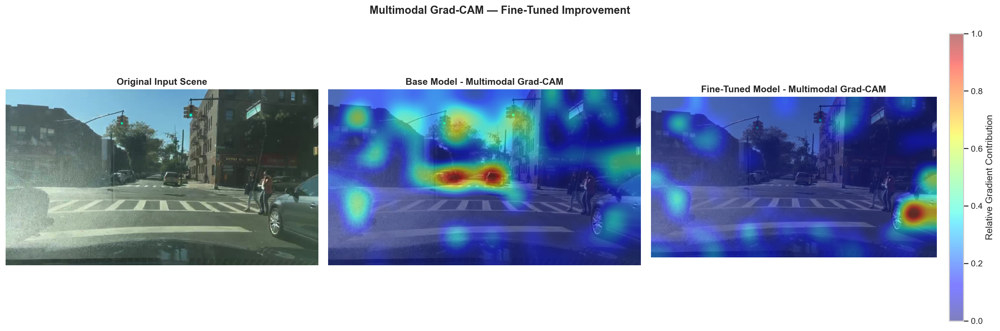


GRAD-CAM SANITY CHECK
Visual grid: 9 x 16 (144 tokens)

Base Model
Activation shape: (144, 2560)
Gradient norm: 0.04973373
Raw CAM min: 0.0
Raw CAM max: 0.00232281
Raw CAM mean: 0.00038859
Raw CAM std: 0.00044434

Fine-Tuned Model
Activation shape: (144, 2560)
Gradient norm: 0.01887113
Raw CAM min: 0.0
Raw CAM max: 0.00101931
Raw CAM mean: 8.075e-05
Raw CAM std: 0.00014127


Evaluation ID:
hazard_and_anomaly_detection::had_pos_0316

User Prompt:
Determine whether the image contains a rule-defined visible potential hazard: either a sufficiently large vulnerable road user very near the directly drivable area, or a large close vehicle occupying the central directly drivable area. Return the decision, hazard type, involved objects, location, severity, and visible evidence.

Ground Truth:
A visible person is within 1 pixels of the directly drivable area in the lower portion of the image.

Base Model Output:
Decision: No

Hazard Type: None

Involved Objects: None

Location: None

Severity: 

In [ ]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt

from contextlib import nullcontext
from pathlib import Path
from PIL import Image
from qwen_vl_utils import process_vision_info


# Select Scene A

SCENE_ID = "hazard_and_anomaly_detection::had_pos_0316"

xai_sample = (
    xai_sample_pool[
        xai_sample_pool["evaluation_id"] == SCENE_ID
    ]
    .iloc[0]
    .copy()
)

image_path = IMAGE_ROOT / Path(xai_sample["image_path"])
image = Image.open(image_path).convert("RGB")
original_image = np.array(image)

query_text = str(xai_sample["instruction"])

model_device = next(xai_model.parameters()).device


# Prepare multimodal input

messages = [
    {
        "role": "user",
        "content": [
            {
                "type": "image",
                "image": str(image_path),
                "min_pixels": 256 * 256,
                "max_pixels": 384 * 384,
            },
            {
                "type": "text",
                "text": query_text,
            },
        ],
    }
]

text_prompt = processor.apply_chat_template(
    messages,
    tokenize=False,
    add_generation_prompt=True,
)

image_inputs, video_inputs = process_vision_info(messages)

inputs = processor(
    text=[text_prompt],
    images=image_inputs,
    videos=video_inputs,
    padding=True,
    return_tensors="pt",
)

inputs = {
    key: (
        value.to(model_device)
        if isinstance(value, torch.Tensor)
        else value
    )
    for key, value in inputs.items()
}

prompt_length = inputs["input_ids"].shape[1]


# Find Qwen3-VL visual merger

visual_merger = None
visual_merger_name = None

for name, module in xai_model.named_modules():

    if name.endswith("visual.merger"):
        visual_merger = module
        visual_merger_name = name
        break


if visual_merger is None:
    raise RuntimeError(
        "Qwen3-VL visual merger could not be located."
    )


print("Grad-CAM target module:")
print(visual_merger_name)


#  Base / Fine-Tuned context helper


def model_context(use_adapter):

    if use_adapter:
        return nullcontext()

    return xai_model.disable_adapter()


# Generate response + extract Grad-CAM

def generate_gradcam(use_adapter):

    # Generate original response

    with torch.no_grad():

        with model_context(use_adapter):

            generated_ids = xai_model.generate(
                **inputs,
                max_new_tokens=64,
                do_sample=False,
                use_cache=True,
            )


    target_ids = generated_ids[:, prompt_length:]

    output_text = processor.batch_decode(
        target_ids,
        skip_special_tokens=True,
        clean_up_tokenization_spaces=False,
    )[0].strip()


    # Capture visual-merger activations

    captured = {}

    def capture_activation(
        module,
        module_input,
        module_output,
    ):

        activation = module_output

        if isinstance(activation, (tuple, list)):
            activation = activation[0]

        activation.retain_grad()

        captured["activation"] = activation


    hook = visual_merger.register_forward_hook(
        capture_activation
    )

    # Teacher-forced response sequence

    full_input_ids = torch.cat(
        [
            inputs["input_ids"],
            target_ids,
        ],
        dim=1,
    )


    target_mask = torch.ones(
        (
            1,
            target_ids.shape[1],
        ),
        dtype=inputs["attention_mask"].dtype,
        device=model_device,
    )


    full_attention_mask = torch.cat(
        [
            inputs["attention_mask"],
            target_mask,
        ],
        dim=1,
    )


    # Pixel values must allow gradient propagation
    pixel_values = (
        inputs["pixel_values"]
        .detach()
        .clone()
        .requires_grad_(True)
    )


    forward_inputs = {
        "input_ids": full_input_ids,
        "attention_mask": full_attention_mask,
        "pixel_values": pixel_values,
        "image_grid_thw": inputs["image_grid_thw"],
        "use_cache": False,
        "return_dict": True,
    }


    xai_model.zero_grad(set_to_none=True)

    # Forward pass

    with model_context(use_adapter):

        outputs = xai_model(
            **forward_inputs
        )


    # Logits that predict generated tokens
    response_logits = outputs.logits[
        :,
        prompt_length - 1:
        prompt_length - 1 + target_ids.shape[1],
        :
    ]


    log_probs = torch.log_softmax(
        response_logits,
        dim=-1,
    )


    token_scores = (
        log_probs
        .gather(
            dim=-1,
            index=target_ids.unsqueeze(-1),
        )
        .squeeze(-1)
    )


    # Mean support for the generated response
    target_score = token_scores.mean()


    # Backpropagate response score

    target_score.backward()


    activation = captured["activation"]

    gradient = activation.grad


    hook.remove()


    if gradient is None:
        raise RuntimeError(
            "No gradient reached the visual merger."
        )


    activation = (
        activation
        .detach()
        .float()
    )

    gradient = (
        gradient
        .detach()
        .float()
    )



    # Average gradient over visual tokens to obtain one weight per feature channel.

    channel_weights = gradient.mean(dim=0)


    raw_cam = (
        activation
        * channel_weights
    ).sum(dim=-1)


    # Positive contribution only
    raw_cam = torch.relu(raw_cam)


    return {
        "text": output_text,
        "raw_cam": raw_cam.cpu().numpy(),
        "gradient_norm": gradient.norm().item(),
        "target_score": target_score.detach().item(),
        "activation_shape": tuple(activation.shape),
    }



# Extract Base and Fine-Tuned Grad-CAM

base_result = generate_gradcam(
    use_adapter=False
)

finetuned_result = generate_gradcam(
    use_adapter=True
)



# Convert visual tokens back to spatial grid

grid_t, grid_h, grid_w = (
    inputs["image_grid_thw"][0]
    .detach()
    .cpu()
    .tolist()
)


spatial_merge_size = int(
    xai_model.config
    .vision_config
    .spatial_merge_size
)


merged_h = grid_h // spatial_merge_size
merged_w = grid_w // spatial_merge_size

expected_tokens = (
    grid_t
    * merged_h
    * merged_w
)


if len(base_result["raw_cam"]) != expected_tokens:

    raise ValueError(
        "Base Grad-CAM visual-token count "
        "does not match image grid."
    )


if len(finetuned_result["raw_cam"]) != expected_tokens:

    raise ValueError(
        "Fine-Tuned Grad-CAM visual-token count "
        "does not match image grid."
    )


base_cam = (
    base_result["raw_cam"]
    .reshape(
        grid_t,
        merged_h,
        merged_w,
    )
    .mean(axis=0)
)


finetuned_cam = (
    finetuned_result["raw_cam"]
    .reshape(
        grid_t,
        merged_h,
        merged_w,
    )
    .mean(axis=0)
)


# Normalize only for visualization

def normalize_cam(cam):

    return (
        (cam - cam.min())
        /
        (
            cam.max()
            - cam.min()
            + 1e-8
        )
    )


base_cam_norm = normalize_cam(base_cam)

finetuned_cam_norm = normalize_cam(
    finetuned_cam
)

# Resize heatmaps

image_h, image_w = original_image.shape[:2]


base_heatmap = cv2.resize(
    base_cam_norm,
    (image_w, image_h),
    interpolation=cv2.INTER_CUBIC,
)


finetuned_heatmap = cv2.resize(
    finetuned_cam_norm,
    (image_w, image_h),
    interpolation=cv2.INTER_CUBIC,
)


# Visualization

fig, axes = plt.subplots(
    1,
    3,
    figsize=(18, 6),
    dpi=150,
)


axes[0].imshow(original_image)
axes[0].set_title(
    "Original Input Scene",
    fontweight="bold",
)
axes[0].axis("off")


axes[1].imshow(original_image)

axes[1].imshow(
    base_heatmap,
    cmap="jet",
    alpha=0.50,
    vmin=0,
    vmax=1,
)

axes[1].set_title(
    "Base Model - Multimodal Grad-CAM",
    fontweight="bold",
)

axes[1].axis("off")


axes[2].imshow(original_image)

fine_plot = axes[2].imshow(
    finetuned_heatmap,
    cmap="jet",
    alpha=0.50,
    vmin=0,
    vmax=1,
)

axes[2].set_title(
    "Fine-Tuned Model - Multimodal Grad-CAM",
    fontweight="bold",
)

axes[2].axis("off")


cbar = fig.colorbar(
    fine_plot,
    ax=axes[2],
    fraction=0.046,
    pad=0.04,
)

cbar.set_label(
    "Relative Gradient Contribution"
)


plt.suptitle(
    "Multimodal Grad-CAM — Fine-Tuned Improvement",
    fontsize=14,
    fontweight="bold",
)

plt.tight_layout()
plt.show()


# SANITY CHECK

print("\nGRAD-CAM SANITY CHECK")
print("=" * 50)

print(
    f"Visual grid: "
    f"{merged_h} x {merged_w} "
    f"({expected_tokens} tokens)"
)


for name, result in [
    ("Base", base_result),
    ("Fine-Tuned", finetuned_result),
]:

    raw = result["raw_cam"]

    print(f"\n{name} Model")

    print(
        "Activation shape:",
        result["activation_shape"],
    )

    print(
        "Gradient norm:",
        round(
            result["gradient_norm"],
            8,
        ),
    )

    print(
        "Raw CAM min:",
        round(float(raw.min()), 8),
    )

    print(
        "Raw CAM max:",
        round(float(raw.max()), 8),
    )

    print(
        "Raw CAM mean:",
        round(float(raw.mean()), 8),
    )

    print(
        "Raw CAM std:",
        round(float(raw.std()), 8),
    )


# Experiment output

print("\n" + "=" * 50)

print("\nEvaluation ID:")
print(SCENE_ID)

print("\nUser Prompt:")
print(query_text)

print("\nGround Truth:")
print(xai_sample["ground_truth_text"])

print("\nBase Model Output:")
print(base_result["text"])

print("\nFine-Tuned Model Output:")
print(finetuned_result["text"])

**Scene B — Fine-Tuned Regression**

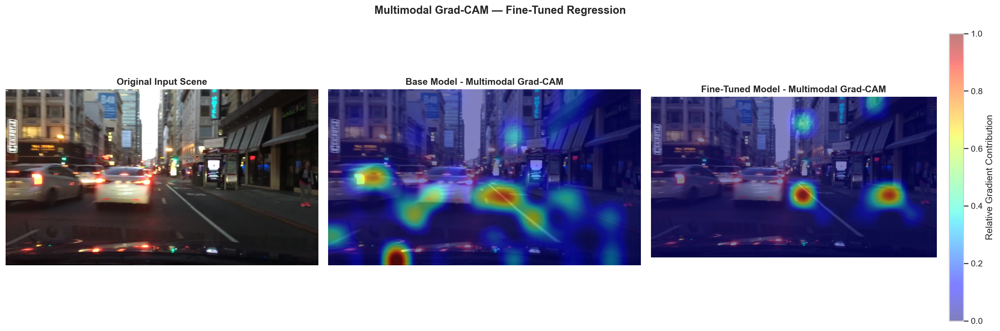


GRAD-CAM SANITY CHECK
Visual grid: 9 x 16 (144 tokens)

Base Model
Gradient norm: 0.03478449
Raw CAM max: 0.00062832
Raw CAM mean: 5.522e-05
Raw CAM std: 0.0001103

Fine-Tuned Model
Gradient norm: 0.02030581
Raw CAM max: 0.0002723
Raw CAM mean: 6.84e-06
Raw CAM std: 3.375e-05


Evaluation ID:
hazard_and_anomaly_detection::had_neg_0392

User Prompt:
Determine whether the image contains a rule-defined visible potential hazard: either a sufficiently large vulnerable road user very near the directly drivable area, or a large close vehicle occupying the central directly drivable area. Return the decision, hazard type, involved objects, location, severity, and visible evidence.

Ground Truth:
No rule-defined potential hazard is present: no sufficiently large vulnerable road user is near the directly drivable area and no large close vehicle occupies its central lower region.

Base Model Output:
Decision: No

Hazard Type: None

Involved Objects: None

Location: None

Severity: None

Visible E

In [ ]:
SCENE_ID = "hazard_and_anomaly_detection::had_neg_0392"

xai_sample = (
    xai_sample_pool[
        xai_sample_pool["evaluation_id"] == SCENE_ID
    ]
    .iloc[0]
    .copy()
)

image_path = IMAGE_ROOT / Path(xai_sample["image_path"])
image = Image.open(image_path).convert("RGB")
original_image = np.array(image)

query_text = str(xai_sample["instruction"])

model_device = next(xai_model.parameters()).device


# Prepare input scene


messages = [
    {
        "role": "user",
        "content": [
            {
                "type": "image",
                "image": str(image_path),
                "min_pixels": 256 * 256,
                "max_pixels": 384 * 384,
            },
            {
                "type": "text",
                "text": query_text,
            },
        ],
    }
]

text_prompt = processor.apply_chat_template(
    messages,
    tokenize=False,
    add_generation_prompt=True,
)

image_inputs, video_inputs = process_vision_info(messages)

inputs = processor(
    text=[text_prompt],
    images=image_inputs,
    videos=video_inputs,
    padding=True,
    return_tensors="pt",
)

inputs = {
    key: (
        value.to(model_device)
        if isinstance(value, torch.Tensor)
        else value
    )
    for key, value in inputs.items()
}

prompt_length = inputs["input_ids"].shape[1]


# Uses generate_gradcam() defined in Scene A

base_result = generate_gradcam(
    use_adapter=False
)

finetuned_result = generate_gradcam(
    use_adapter=True
)


# Reconstruct visual grid

grid_t, grid_h, grid_w = (
    inputs["image_grid_thw"][0]
    .detach()
    .cpu()
    .tolist()
)

spatial_merge_size = int(
    xai_model.config
    .vision_config
    .spatial_merge_size
)

merged_h = grid_h // spatial_merge_size
merged_w = grid_w // spatial_merge_size

expected_tokens = (
    grid_t
    * merged_h
    * merged_w
)


if len(base_result["raw_cam"]) != expected_tokens:
    raise ValueError(
        "Base Grad-CAM token count "
        "does not match image grid."
    )

if len(finetuned_result["raw_cam"]) != expected_tokens:
    raise ValueError(
        "Fine-Tuned Grad-CAM token count "
        "does not match image grid."
    )


base_cam = (
    base_result["raw_cam"]
    .reshape(
        grid_t,
        merged_h,
        merged_w,
    )
    .mean(axis=0)
)

finetuned_cam = (
    finetuned_result["raw_cam"]
    .reshape(
        grid_t,
        merged_h,
        merged_w,
    )
    .mean(axis=0)
)


# Normalize for visualization

base_cam_norm = normalize_cam(
    base_cam
)

finetuned_cam_norm = normalize_cam(
    finetuned_cam
)


# Resize heatmaps

image_h, image_w = original_image.shape[:2]

base_heatmap = cv2.resize(
    base_cam_norm,
    (image_w, image_h),
    interpolation=cv2.INTER_CUBIC,
)

finetuned_heatmap = cv2.resize(
    finetuned_cam_norm,
    (image_w, image_h),
    interpolation=cv2.INTER_CUBIC,
)

# Visualization

fig, axes = plt.subplots(
    1,
    3,
    figsize=(18, 6),
    dpi=150,
)


axes[0].imshow(original_image)
axes[0].set_title(
    "Original Input Scene",
    fontweight="bold",
)
axes[0].axis("off")


axes[1].imshow(original_image)
axes[1].imshow(
    base_heatmap,
    cmap="jet",
    alpha=0.50,
    vmin=0,
    vmax=1,
)
axes[1].set_title(
    "Base Model - Multimodal Grad-CAM",
    fontweight="bold",
)
axes[1].axis("off")


axes[2].imshow(original_image)

fine_plot = axes[2].imshow(
    finetuned_heatmap,
    cmap="jet",
    alpha=0.50,
    vmin=0,
    vmax=1,
)

axes[2].set_title(
    "Fine-Tuned Model - Multimodal Grad-CAM",
    fontweight="bold",
)
axes[2].axis("off")


cbar = fig.colorbar(
    fine_plot,
    ax=axes[2],
    fraction=0.046,
    pad=0.04,
)

cbar.set_label(
    "Relative Gradient Contribution"
)


plt.suptitle(
    "Multimodal Grad-CAM — Fine-Tuned Regression",
    fontsize=14,
    fontweight="bold",
)

plt.tight_layout()
plt.show()


# SANITY CHECK

print("\nGRAD-CAM SANITY CHECK")
print("=" * 50)

print(
    f"Visual grid: "
    f"{merged_h} x {merged_w} "
    f"({expected_tokens} tokens)"
)


for name, result in [
    ("Base", base_result),
    ("Fine-Tuned", finetuned_result),
]:

    raw = result["raw_cam"]

    print(f"\n{name} Model")

    print(
        "Gradient norm:",
        round(result["gradient_norm"], 8),
    )

    print(
        "Raw CAM max:",
        round(float(raw.max()), 8),
    )

    print(
        "Raw CAM mean:",
        round(float(raw.mean()), 8),
    )

    print(
        "Raw CAM std:",
        round(float(raw.std()), 8),
    )


# Experiment output

print("\n" + "=" * 50)

print("\nEvaluation ID:")
print(SCENE_ID)

print("\nUser Prompt:")
print(query_text)

print("\nGround Truth:")
print(xai_sample["ground_truth_text"])

print("\nBase Model Output:")
print(base_result["text"])

print("\nFine-Tuned Model Output:")
print(finetuned_result["text"])